<h1><b> Méthode : Filtre Variationnel (4D-Var) </b></h1>

Ce notebook présente l'utilisation du fichier ? pour assimiler des données utilisant une méthode variationnelle.

In [1]:
import numpy as np
import spotpy
import matplotlib.pyplot as plt

In [2]:
%matplotlib inline
import sys
import copy
import datetime as dt

import pandas as pd
import numpy as np
import matplotlib
matplotlib.style.use("ggplot")
import matplotlib.pyplot as plt

from dataloader import Dataloader 
from pcse.base import ParameterProvider

import pcse
from pcse.models import Wofost72_WLP_FD
print("This notebook was built with:")
print(f"python version: {sys.version}")
print(f"PCSE version: {pcse.__version__}")

from utils import *


This notebook was built with:
python version: 3.10.6 (tags/v3.10.6:9c7b4bd, Aug  1 2022, 21:53:49) [MSC v.1932 64 bit (AMD64)]
PCSE version: 5.5.6


## 1 - Paramètres de WOFOST

Dans cette partie, on va charger les paramètres qui serviront à modéliser le champ avec Wofost.

Dans cet exemple, on va essayer de simuler le champ de notre client


In [3]:
dataloader = Dataloader("data")

# ===  1 - Crop Data ===
dataloader.printCropNames()
dataloader.printCropVarietes('potato')

cropd = dataloader.getCropData('potato', 'Innovator')
# Alternativement, vous pouvez charger un fichier
# cropd = dataloader.readCropData("POT701.CAB")



# === 2 - Paramètres du sol ===
# Chargé depuis un fichier
# 1. **EC1-Coarse**
# 2. **EC2-Medium**
# 3. **EC3-Medium Fine**
# 4. **EC4-Fine**
# 5. **EC5-Very Fine**
# 6. **EC6-Fine and Permeable (Peat)**
soild = dataloader.readSoilData("ec3.soil")

# === 3 - Paramètres du site ===
# Il s'agit des paramètres du site, indépendamment de l'espèce
#        - WAV       Initial amount of water in total soil profile [cm] <- OBLIGATOIRE
#        - IFUNRN    Indicates whether non-infiltrating fraction of rain is a function of storm size (1)
#                    or not (0). Default 0
#        - NOTINF    Maximum fraction of rain not-infiltrating into the soil [0-1], default 0.
#        - SSMAX     Maximum depth of water that can be stored on the soil surface [cm]
#        - SSI       Initial depth of water stored on the surface [cm]
#        - SMLIM     Initial maximum moisture content in initial rooting depth zone [0-1], default 0.4
sited = dataloader.getSiteData(WAV=10)


# === 4 - Agromanagement ===
agrod = dataloader.readAgromanagementData('osiris_rampe_cleaned.agro')

# === 5 - Météo ===
weatherd = dataloader.getWeatherData(lat=49.5652319502033, lon=2.4757816885380457)

# On rassemble tout
parameters = ParameterProvider(cropdata=cropd, soildata=soild, sitedata=sited)

Voici la liste des espèces disponibles :
['barley', 'cassava', 'chickpea', 'cotton', 'cowpea', 'fababean', 'groundnut', 'maize', 'millet', 'mungbean', 'pigeonpea', 'potato', 'rapeseed', 'rice', 'sorghum', 'soybean', 'sugarbeet', 'sugarcane', 'sunflower', 'sweetpotato', 'tobacco', 'wheat', 'seed_onion']
Voici la liste des variétés disponibles pour : potato
['Potato_701', 'Potato_702', 'Potato_703', 'Potato_704', 'Innovator', 'Fontane', 'Markies', 'Premiere', 'Festien']


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

In [4]:
cropd = dataloader.getCropData('potato', 'Innovator')
print(cropd)

YAMLCropDataProvider - current active crop 'potato' with variety 'Innovator'
Available crop parameters:
 {'CO2EFFTB': [40.0, 0.0, 360.0, 1.0, 720.0, 1.11, 1000.0, 1.11, 2000.0, 1.11], 'CO2TRATB': [40.0, 0.0, 360.0, 1.0, 720.0, 0.9, 1000.0, 0.9, 2000.0, 0.9], 'CO2AMAXTB': [40.0, 0.0, 360.0, 1.0, 720.0, 1.6, 1000.0, 1.9, 2000.0, 1.9], 'TBASEM': 3.0, 'TEFFMX': 18.0, 'TSUMEM': 255, 'IDSL': 0, 'DLO': -99.0, 'DLC': -99.0, 'TSUM1': 187, 'TSUM2': 2100, 'DTSMTB': [0.0, 0.0, 2.0, 0.0, 13.0, 11.0, 30.0, 28.0], 'DVSI': 0.0, 'DVSEND': 2.0, 'VERNBASE': 14.0, 'VERNSAT': 70.0, 'VERNDVS': 0.3, 'VERNRTB': [-8.0, 0.0, -4.0, 0.0, 3.0, 1.0, 10.0, 1.0, 17.0, 0.0, 20.0, 0.0], 'TDWI': 75.0, 'RGRLAI': 0.017, 'SLATB': [0.0, 0.0017, 1.0, 0.0024, 2.0, 0.0024], 'SPA': 0.0, 'SSATB': [0.0, 0.0, 2.0, 0.0], 'SPAN': 35.0, 'TBASE': 2.0, 'KDIFTB': [0.0, 1.0, 2.0, 1.0], 'EFFTB': [0.0, 0.49, 40.0, 0.49], 'AMAXTB': [0.0, 33.0, 2.0, 33.0], 'REFCO2L': 400, 'TMPFTB': [0.0, 0.01, 3.0, 0.01, 10.0, 0.75, 15.0, 1.0, 24.0, 1.0, 29.

## 2 - Simulation

On peut maintenant prédire avec WoFOST

In [5]:
wofost_noDA = getWofost_WaterLimited(parameters, weatherd, agrod)
wofost_noDA.run_till_terminate()
df_wofost_noDA = pd.DataFrame(wofost_noDA.get_output())
df_wofost_noDA = df_wofost_noDA.set_index("day")
df_wofost_noDA.tail()
#plotWofostDF(df_wofost_noDA)

--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

,DVS,LAI,TAGP,TWSO,TWLV,TWST,TWRT,TRA,RD,SM,WWLOW
day,,,,,,,,,,,
2022-10-02,1.983857,0.0,15561.13719,12050.586227,1857.265611,1653.285351,1441.889672,0.0,50.0,0.210785,22.854223
2022-10-03,1.989233,0.0,15561.13719,12050.586227,1857.265611,1653.285351,1441.889672,0.0,50.0,0.233511,23.990529
2022-10-04,1.993524,0.0,15561.13719,12050.586227,1857.265611,1653.285351,1441.889672,0.0,50.0,0.231742,23.902066
2022-10-05,1.998490,0.0,15561.13719,12050.586227,1857.265611,1653.285351,1441.889672,0.0,50.0,0.230323,23.831142
2022-10-06,2.000000,0.0,15561.13719,12050.586227,1857.265611,1653.285351,1441.889672,0.0,50.0,0.229986,23.814270


# 3 - Observations

On va réaliser des observations pour améliorer notre simulation : c'est la data assimilation.

Dans cette partie, on va utiliser les observations du client

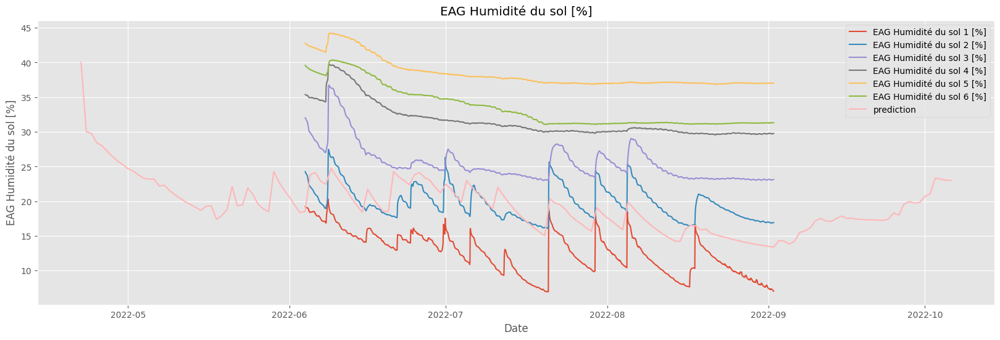

In [6]:
import matplotlib.pyplot as plt

df_obs = dataloader.readOsirisData('Sonde Rampe 1.csv')
df_obs = df_obs[df_obs['Date/heure'] < pd.Timestamp("2022-09-02")]
df_obs = df_obs[df_obs['Date/heure'] > pd.Timestamp("2022-06-04")]

plt.figure(figsize=(20, 6))

for i in range(1, 7):
    column_name = f'EAG Humidité du sol {i} [%]'
    plt.plot(df_obs['Date/heure'],df_obs[column_name], label=column_name)
    
plt.plot(df_wofost_noDA.index, df_wofost_noDA['SM']*100, label='prediction')
plt.title("EAG Humidité du sol [%]")
plt.xlabel('Date')
plt.legend()
plt.ylabel("EAG Humidité du sol [%]")
plt.grid(True)
plt.show()

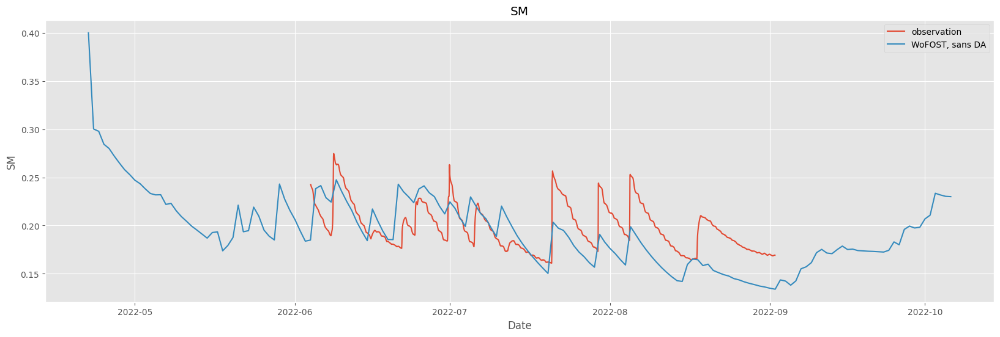

In [7]:
plt.figure(figsize=(20, 6))

plt.plot(df_obs['Date/heure'], df_obs['SM'], label = 'observation')
plt.plot(df_wofost_noDA.index, df_wofost_noDA['SM'], label='WoFOST, sans DA')
plt.title("SM")
plt.xlabel('Date')
plt.legend()
plt.ylabel("SM")
plt.grid(True)
plt.show()

Pour mesurer l'effet de la fréquence des mesures, on va échantilloner les données à notre disposition

In [37]:
NB_DAYS_DELTA = 4
dates_of_observation, observed_sm = dataloader.getOsirisSM(filename = 'Sonde Rampe 1.csv', timedelta = pd.Timedelta(NB_DAYS_DELTA, "d"), error = 0.0, begin = pd.Timestamp("2022-06-04"), end = pd.Timestamp("2022-09-02"))

observed_sm = np.array(observed_sm)
std_sm = observed_sm * 0.05 # Std. devation is estimated as 5% of observed value

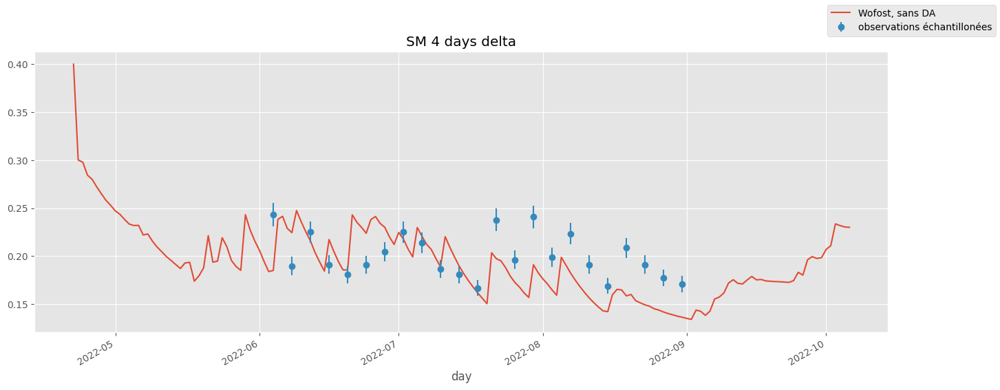

In [38]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(16,6), sharex=True)
df_wofost_noDA["SM"].plot(ax=axes, label="Wofost, sans DA")
axes.errorbar(dates_of_observation, observed_sm, yerr=std_sm, fmt="o", label='observations échantillonées')
axes.set_title("SM "+str(NB_DAYS_DELTA)+" days delta")
fig.autofmt_xdate()
fig.legend()

In [39]:
observations_for_DA = [(d, {"SM": (sm, errsm)}) for d, sm, errsm in zip(dates_of_observation, observed_sm, std_sm)]

# 4 - 4DVAR

Utilisons un modèle variationnel pour corriger les estimations.

In [40]:
observations_for_DA

[(Timestamp('2022-06-04 00:00:00'),
  {'SM': (0.24350000000000002, 0.012175000000000002)}),
 (Timestamp('2022-06-08 00:00:00'), {'SM': (0.18969999999999998, 0.009485)}),
 (Timestamp('2022-06-12 00:00:00'), {'SM': (0.225, 0.011250000000000001)}),
 (Timestamp('2022-06-16 00:00:00'), {'SM': (0.1911, 0.009555000000000001)}),
 (Timestamp('2022-06-20 00:00:00'), {'SM': (0.1807, 0.009035)}),
 (Timestamp('2022-06-24 00:00:00'), {'SM': (0.1907, 0.009535000000000002)}),
 (Timestamp('2022-06-28 00:00:00'), {'SM': (0.2045, 0.010225)}),
 (Timestamp('2022-07-02 00:00:00'),
  {'SM': (0.22510000000000002, 0.011255000000000001)}),
 (Timestamp('2022-07-06 00:00:00'), {'SM': (0.2139, 0.010695000000000001)}),
 (Timestamp('2022-07-10 00:00:00'), {'SM': (0.1865, 0.009325)}),
 (Timestamp('2022-07-14 00:00:00'), {'SM': (0.1805, 0.009025)}),
 (Timestamp('2022-07-18 00:00:00'), {'SM': (0.1666, 0.00833)}),
 (Timestamp('2022-07-22 00:00:00'), {'SM': (0.2378, 0.011890000000000001)}),
 (Timestamp('2022-07-26 00:00:

In [41]:
print('== Current parameters ==')
print('TDWI', parameters['TDWI'])
print('WAV', parameters['WAV'])
print('SPAN', parameters['SPAN'])
print('SMFCF', parameters['SMFCF'])

== Current parameters ==
TDWI 75.0
WAV 10.0
SPAN 35.0
SMFCF 0.3


In [42]:
"""
Ce code est basé sur un code de Tobias Houska, fournis dans Statistical Parameter Estimation Tool (SPOTPY).
Il a été modifié pour s'adapter à notre cas d'étude.
"""


import os
from spotpy.examples.hymod_python.hymod import hymod
from spotpy.objectivefunctions import rmse
from spotpy.parameter import Uniform, Normal


class spot_setup(object):

    # on peut rajouter des paramètres pour compléter
    param_tdwi = Normal(mean=parameters['TDWI'], stddev=10.)
    param_wav = Normal(mean=parameters['WAV'], stddev=1.0)
    param_span = Normal(mean=parameters['SPAN'], stddev=4.)
    param_smfcf = Normal(mean=parameters['SMFCF'], stddev=0.1)
    

    def __init__(self, weather, agrod, observations_for_DA):
        print('[4D VAR] Initialisation...')


        self.weather = weather
        self.agrod = agrod
        self.dates_of_observation = [infos[0] for infos in observations_for_DA]
        self.variables_for_DA = observations_for_DA[0][1].keys()
        self.observations_for_DA = observations_for_DA

        self.paramName_to_id = dict()
        for paramName in self.variables_for_DA:
            self.paramName_to_id[paramName] = len(self.paramName_to_id)

        self.cov_matrix = np.zeros((len(self.dates_of_observation), len(self.variables_for_DA), len(self.variables_for_DA)))
        for i in range(len(observations_for_DA)):
            infos = observations_for_DA[i]
            data = infos[1]

            for paramName, value in data.items():
                paramId = self.paramName_to_id[paramName]
                self.cov_matrix[i, paramId, paramId] = value[1] ** 2

        print("[4D VAR] Init Done")

    def simulation(self, x):
        """
        x : paramètres (tableau)

        Cette fonction doit retourner un tableau contenant les données prédites par le modèle, pour les paramètres données
        """
        print('Simulation...')
        tdwi = x[0]
        wav = x[1]
        span = x[2]
        smfcf = x[3]
        print("[4D VAR - Simulation] Simulating with TDWI: {}  WAV : {} SPAN: {}  SMFCF : {} ".format(tdwi, wav, span, smfcf))       

        p = copy.deepcopy(parameters)
        p.set_override("TDWI", tdwi)
        p.set_override("WAV", wav)
        p.set_override("SPAN", span)
        p.set_override("SMFCF", smfcf)

        member = Wofost72_WLP_FD(p, self.weather, self.agrod)

        try:
            member.run_till_terminate()
            df = pd.DataFrame(member.get_output())
            df['day'] = pd.to_datetime(df['day'])
            df = df.set_index("day")

            corrected_list = np.zeros(len(self.dates_of_observation) * len(self.variables_for_DA))
            
            for paramName in self.variables_for_DA:

                for i, eval_date in enumerate(self.dates_of_observation):
                    
                    id = self.paramName_to_id[paramName] * len(self.dates_of_observation) + i

                    corrected_list[id] = df[df.index == eval_date][paramName].iloc[0]


            print("=== Corrected_state ===")
            print(corrected_list)

            print("Simulation done")
            return corrected_list
        except:
            print("[4D VAR - Simulation] ERROR - An error occured, abort")


            corrected_list = np.zeros(len(self.dates_of_observation) * len(self.variables_for_DA))
            
            return corrected_list

    def evaluation(self):        
        """
        Cette fonction doit donner les variables observés
        """

        observed_list = np.zeros(len(self.dates_of_observation) * len(self.variables_for_DA))
        
        for paramName in self.variables_for_DA:

            for i, eval_date in enumerate(self.dates_of_observation):
                #print(i, eval_date)

                id = self.paramName_to_id[paramName] * len(self.dates_of_observation) + i

                eval_infos = self.observations_for_DA[i][1]
                observed_list[id] = eval_infos[paramName][0]
            

        #print("Evaluation done")
        return observed_list


    def cost_function(self, estimated_list, observed_list, cov_matrix):
        J = 0
        estimated_state = np.reshape(estimated_list, (len(self.variables_for_DA), len(self.dates_of_observation)))
        observed_state = np.reshape(observed_list, (len(self.variables_for_DA), len(self.dates_of_observation)))
        for i in range(estimated_state.shape[1]):
            J += 1/2 * (observed_state[:, i]-estimated_state[:, i]).T @ \
                np.linalg.inv(
                    cov_matrix[i]) @ (observed_state[:, i]-estimated_state[:, i])
        return J

    def objectivefunction(self, simulation, evaluation, params=None):
        """
        Simulation : tableau contenant les données simulées
        Evaluation : tableau contenant les variables observés
        """        
        corrected_J = self.cost_function(simulation, evaluation, self.cov_matrix)

        print('J', corrected_J)
        return corrected_J

In [43]:
spot_setup=spot_setup(weatherd, agrod, observations_for_DA)

[4D VAR] Initialisation...
[4D VAR] Init Done


In [44]:
sampler=spotpy.algorithms.sceua(spot_setup, dbname='test_4dvar', dbformat='csv')

In [45]:
rep=100
sampler.sample(rep, ngs=7, kstop=3, peps=0.1, pcento=0.1)

Initializing the  Shuffled Complex Evolution (SCE-UA) algorithm  with  100  repetitions
The objective function will be minimized
Starting burn-in sampling...
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 93.63518478542069  WAV : 12.15959619192567 SPAN: 44.92488949884488  SMFCF : 0.24307240735320895 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18388593 0.22610936 0.22003627 0.21990845 0.18587141 0.22373211
 0.2299204  0.21776004 0.21978708 0.18627865 0.18225228 0.14826739
 0.18334094 0.15627971 0.17415616 0.14594968 0.1626911  0.13677131
 0.12453526 0.14340856 0.13134473 0.12074432 0.11415178]
Simulation done
J 210.41230983614315
Initialize database...
['csv', 'hdf5', 'ram', 'sql', 'custom', 'noData']
* Database file 'test_4dvar.csv' created.
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 73.7042793679682  WAV : 9.916912288752437 SPAN: 32.25994084724  SMFCF : 0.48394190739126325 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21803692 0.25408452 0.24355824 0.25173165 0.22596099 0.26614908
 0.2727818  0.26468292 0.27415752 0.24722521 0.25462195 0.22830083
 0.26222124 0.23929427 0.25700013 0.23218305 0.25091842 0.22698738
 0.21343186 0.22841873 0.21961326 0.21295776 0.20797037]
Simulation done
J 283.451766630195
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 80.04151771815307  WAV : 9.736728203678759 SPAN: 33.401067939798814  SMFCF : 0.3169530625235672 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18587953 0.22513575 0.21577402 0.21836154 0.18789886 0.22658504
 0.23278279 0.22063859 0.22391296 0.19281246 0.19470843 0.16706047
 0.20253203 0.17819131 0.19643231 0.17049672 0.18824255 0.16294235
 0.14921435 0.16489653 0.1559882  0.14915282 0.14404373]
Simulation done
J 90.19112276253824
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 70.1794370327266  WAV : 9.056276285115397 SPAN: 32.183292426180294  SMFCF : 0.3586617713005807 
=== Corrected_state ===
[0.19589007 0.23295849 0.2217191  0.22608977 0.19728096 0.23637972
 0.24262156 0.23110811 0.23643473 0.20646818 0.21023966 0.18270817
 0.21735046 0.19347866 0.21127959 0.18567322 0.20381876 0.17952423
 0.16650474 0.18184    0.17310492 0.1665368  0.16160079]
Simulation done
J 70.93524741554062
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 65.80334135280705  WAV : 11.054648489482986 SPAN: 28.07097804998725  SMFCF : 0.10716601636914488 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.09915221 0.10847346 0.10101923 0.1329126  0.10312684 0.10611397
 0.10752651 0.10651172 0.10726602 0.09660078 0.09827948 0.08911757
 0.10796602 0.0965102  0.12948221 0.09952783 0.1028695  0.09091966
 0.08520218 0.10132187 0.09543107 0.09036195 0.08605285]
Simulation done
J 1110.297344380832
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 69.03443199806242  WAV : 11.187150309791518 SPAN: 36.72552992713987  SMFCF : 0.2576961962559463 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18618232 0.22692881 0.21989329 0.21922988 0.18462642 0.22247811
 0.22870019 0.21659742 0.21872225 0.18535049 0.1821485  0.15089186
 0.18643601 0.16019421 0.17836914 0.15083372 0.1677562  0.14187041
 0.12879519 0.146918   0.13675063 0.12881646 0.12321477]
Simulation done
J 176.07486531534934
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 74.4942414800362  WAV : 10.938939172589402 SPAN: 33.55414391943795  SMFCF : 0.11619925193459535 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.10725064 0.11723697 0.10815243 0.13994702 0.10963726 0.11436735
 0.1158079  0.1118978  0.11629925 0.10243439 0.10444549 0.0966328
 0.11699925 0.10272785 0.1364724  0.10583169 0.11105496 0.09830215
 0.09365085 0.10936891 0.10269931 0.09783315 0.09359833]
Simulation done
J 949.0726696711794
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 67.81352415342262  WAV : 9.464594507454006 SPAN: 41.99120149336976  SMFCF : 0.3724607319361472 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20214926 0.23863993 0.22704703 0.23120762 0.20236429 0.24145831
 0.24770448 0.23635263 0.24189507 0.21203721 0.21603812 0.18836012
 0.22268492 0.1988606  0.21645156 0.19086198 0.20882452 0.1826381
 0.16552975 0.18317126 0.16994334 0.15643155 0.14730016]
Simulation done
J 89.22840398857609
8 of 100, minimal objective function=70.9352, time remaining: 00:00:21
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 83.19900112821173  WAV : 8.898380414538185 SPAN: 31.237924989051727  SMFCF : 0.25195052111420124 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.16868357 0.20917035 0.20169535 0.20257092 0.16931843 0.20723921
 0.21345048 0.20132938 0.20342308 0.17075465 0.17017006 0.1427884
 0.18048758 0.15501108 0.17447966 0.14755469 0.16537213 0.14212439
 0.13163647 0.1472388  0.1392715  0.13325268 0.12865039]
Simulation done
J 177.17045774529817
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 70.86268927228173  WAV : 9.690878794444231 SPAN: 27.926252980454333  SMFCF : 0.44624737934144665 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21275149 0.24875022 0.23735305 0.2445381  0.21804323 0.25772459
 0.26405663 0.25495263 0.26316481 0.23518489 0.2415868  0.21468157
 0.24856042 0.22529945 0.24328656 0.21967356 0.24129737 0.2233659
 0.21338711 0.22850412 0.22168921 0.21630365 0.21198586]
Simulation done
J 212.53346031511964
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 82.02486104729778  WAV : 8.711198027292502 SPAN: 31.89700786643662  SMFCF : 0.28105268392193306 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17307748 0.21315983 0.20461913 0.2068679  0.17554802 0.21406579
 0.22027535 0.2081513  0.21104728 0.17918512 0.18016009 0.15299169
 0.18970087 0.16483288 0.18384466 0.15759238 0.17536303 0.1514236
 0.13995435 0.15560471 0.14727203 0.141025   0.13629825]
Simulation done
J 126.70465577950937
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 54.431076428585826  WAV : 8.793449109332776 SPAN: 35.411670402106935  SMFCF : 0.23854199986159927 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17445644 0.21443193 0.20718689 0.20718956 0.17251205 0.21034093
 0.21665117 0.20469866 0.20707636 0.17405513 0.17125054 0.14149237
 0.17862789 0.15226612 0.1714296  0.14373998 0.16089447 0.13538273
 0.12376801 0.14092533 0.13148229 0.12438977 0.11931192]
Simulation done
J 210.9429555606035
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 79.15530117021586  WAV : 10.634404830169421 SPAN: 37.053697817443805  SMFCF : 0.3896300096908547 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20918364 0.2458848  0.23429865 0.23834142 0.20960215 0.24866907
 0.25487876 0.24367244 0.24923254 0.21929172 0.22338598 0.19538683
 0.22930551 0.20553482 0.22278239 0.19716064 0.21508778 0.18873012
 0.17124726 0.18819766 0.17732015 0.16817622 0.16154549]
Simulation done
J 106.33890949378427
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 50.25119826066165  WAV : 11.164733421427753 SPAN: 28.17465114229722  SMFCF : 0.2819711353030789 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19611119 0.23540729 0.2274504  0.22693613 0.19250709 0.23034717
 0.23661349 0.22458604 0.22683776 0.19364302 0.19159289 0.16068849
 0.19534983 0.1694657  0.18742086 0.1613862  0.18088106 0.16083562
 0.15114584 0.16627235 0.15925199 0.15380879 0.14946943]
Simulation done
J 104.56947052147761
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 84.82761919482192  WAV : 9.566841523010456 SPAN: 37.75719114138809  SMFCF : 0.33274210214115596 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18800348 0.22688249 0.21691948 0.22058533 0.19113215 0.23002835
 0.23622511 0.22412428 0.22829415 0.19765764 0.20038478 0.17278479
 0.20793188 0.18382842 0.20187165 0.17608336 0.19390767 0.1678802
 0.15184362 0.16974418 0.15847808 0.14934571 0.14273374]
Simulation done
J 84.79418885729474
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 79.88556927594273  WAV : 9.727445618007513 SPAN: 38.13517254806209  SMFCF : 0.3705936454533637 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19990757 0.2370982  0.22577481 0.23023945 0.20165091 0.24076955
 0.24698334 0.23555079 0.24101303 0.21105238 0.21501226 0.18731736
 0.22169918 0.19791371 0.21549617 0.18990512 0.20786859 0.18166697
 0.16459581 0.18213296 0.17035392 0.1606757  0.15377944]
Simulation done
J 84.35152018568229
16 of 100, minimal objective function=70.9352, time remaining: 00:00:21
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 62.16336505549487  WAV : 9.251153276796556 SPAN: 36.357283187749246  SMFCF : 0.2715021190130314 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17911092 0.21836184 0.21024025 0.21090956 0.17762936 0.21557101
 0.22181461 0.20974856 0.21209331 0.17969037 0.17931043 0.15126081
 0.18780268 0.16251525 0.18141001 0.15478597 0.17205038 0.14641295
 0.1328461  0.15055197 0.140466   0.13251009 0.12693406]
Simulation done
J 152.13889599827687
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 68.86470368960886  WAV : 11.705523280206465 SPAN: 30.53352574773691  SMFCF : 0.5422649152757115 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.23425796 0.27072615 0.26123442 0.27022329 0.24476295 0.28545134
 0.29251675 0.28511847 0.29560055 0.26962541 0.27775462 0.25191326
 0.28576402 0.2631071  0.28098508 0.25646218 0.27601085 0.25476953
 0.24310604 0.2578643  0.2499999  0.24399534 0.23938775]
Simulation done
J 597.9356350272723
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 71.06890107902588  WAV : 10.816727261043974 SPAN: 33.687673215194906  SMFCF : 0.32689897168084514 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19621485 0.23479733 0.22541572 0.22678015 0.19531347 0.2337464
 0.23994797 0.22781032 0.23087691 0.19945033 0.20085591 0.17250539
 0.20734907 0.18285996 0.20067741 0.17462003 0.19223757 0.16648985
 0.15222261 0.1680303  0.15881851 0.15178494 0.14660412]
Simulation done
J 91.65431929239077
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 63.75956421604487  WAV : 9.799208028735674 SPAN: 32.69470722539977  SMFCF : 0.39162552435902054 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20931609 0.24509377 0.2330379  0.23724539 0.20853223 0.24766028
 0.25392417 0.24302945 0.24896795 0.2193476  0.22375845 0.19601674
 0.23001553 0.20626419 0.22365017 0.1981052  0.21620514 0.19128818
 0.17717587 0.19244587 0.1833639  0.17653579 0.17150509]
Simulation done
J 101.7358438285786
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 61.759217706772844  WAV : 10.993526994133235 SPAN: 37.868844490896244  SMFCF : 0.21893757270012004 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18385962 0.21463569 0.20170891 0.20489925 0.17264178 0.20804435
 0.21433669 0.20235343 0.20467817 0.17158398 0.1678958  0.13593933
 0.17340231 0.14604718 0.16538757 0.13701823 0.15401158 0.12860266
 0.11823372 0.13664955 0.12580646 0.11794873 0.11282681]
Simulation done
J 250.4972527758868
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 65.81789854168537  WAV : 9.427110878420068 SPAN: 32.64201292199935  SMFCF : 0.20914287997014439 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17319931 0.20454282 0.19171214 0.19481406 0.16235388 0.19824753
 0.20456036 0.19261231 0.19499783 0.16198641 0.15836529 0.12930021
 0.16868658 0.141379   0.16167667 0.13335164 0.15062303 0.12630245
 0.1171676  0.13326495 0.12471503 0.11865921 0.11408433]
Simulation done
J 279.8053572864125
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 80.93242147235394  WAV : 10.97051958285736 SPAN: 30.937777165753165  SMFCF : 0.34154821124257034 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19801338 0.23663164 0.22689533 0.22903083 0.19858257 0.23720714
 0.24339479 0.23123331 0.23479781 0.20378277 0.20597206 0.17771049
 0.21230978 0.18805042 0.20569574 0.17982436 0.19817619 0.17501913
 0.16335237 0.17861266 0.1704319  0.16427209 0.15962234]
Simulation done
J 78.14205220859486
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 86.31431052019569  WAV : 9.8977874581171 SPAN: 41.423112295412565  SMFCF : 0.27079736681516103 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17605895 0.2165394  0.20886691 0.20986572 0.17700048 0.21498876
 0.22117944 0.20902314 0.2112615  0.17871845 0.17833338 0.15042049
 0.18712726 0.16190106 0.18083153 0.15422658 0.17149159 0.14586388
 0.13228614 0.15107039 0.13888204 0.1278396  0.12100115]
Simulation done
J 162.00594170259558
24 of 100, minimal objective function=70.9352, time remaining: 00:00:19
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 66.46414398094993  WAV : 9.42896977783301 SPAN: 35.46491844873069  SMFCF : 0.36347734299217116 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19994471 0.23672596 0.22543667 0.22932329 0.2002047  0.23922977
 0.24547603 0.23394126 0.23916535 0.20913908 0.21281527 0.18509915
 0.21954664 0.19563066 0.21329564 0.1876487  0.20556933 0.17942767
 0.16315951 0.17909488 0.16926893 0.16131138 0.15551194]
Simulation done
J 81.42804790673279
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 58.36755473110328  WAV : 8.106729453089228 SPAN: 35.92390699719323  SMFCF : 0.30840176373150674 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18177139 0.21991899 0.2100612  0.21296918 0.18253496 0.22133024
 0.22760507 0.21559253 0.21920818 0.18847022 0.19058185 0.16343466
 0.19931529 0.17491396 0.1935211  0.16762538 0.1853685  0.15959752
 0.14467369 0.16162717 0.15172411 0.14382063 0.13810868]
Simulation done
J 98.99208740214229
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 83.96070879353336  WAV : 10.47572008302516 SPAN: 34.2466798253142  SMFCF : 0.21763339076937466 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17488857 0.21238917 0.19926042 0.20103548 0.16810557 0.20595574
 0.21218338 0.20009009 0.20223094 0.16888142 0.16498514 0.13405543
 0.17213637 0.14493548 0.16453047 0.13616945 0.15322925 0.128028
 0.11819035 0.13483246 0.12590021 0.11943798 0.11468936]
Simulation done
J 257.88775068201574
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 74.91867664871182  WAV : 9.42141475065862 SPAN: 40.409179368228656  SMFCF : 0.1034053098269864 
[4D VAR - Simulation] ERROR - An error occured, abort
J 4599.999999999999
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 85.9496488459531  WAV : 11.518429080469296 SPAN: 30.028194057088125  SMFCF : 0.35972664255310116 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20427301 0.24254856 0.232432   0.23488561 0.20485066 0.24354047
 0.24972063 0.23765567 0.24168987 0.21087828 0.21351024 0.18506302
 0.21922053 0.1950727  0.21240583 0.18678694 0.20563732 0.18385183
 0.17268636 0.18770421 0.18001995 0.17411035 0.16961461]
Simulation done
J 85.83786379341097
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 77.14457220119948  WAV : 11.182268562195839 SPAN: 34.36079362900095  SMFCF : 0.3812996260327153 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21044218 0.24742484 0.23628564 0.2393667  0.20990052 0.24877796
 0.25497963 0.2433444  0.24827308 0.21796583 0.22143771 0.1931283
 0.2269906  0.20303664 0.2202079  0.1944427  0.21225725 0.18610563
 0.17022224 0.18564696 0.17610347 0.16855467 0.1630104 ]
Simulation done
J 106.3720751900239
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 79.23998755753499  WAV : 10.33673694024375 SPAN: 34.98746520024638  SMFCF : 0.2543564006387757 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17775224 0.21854495 0.21145601 0.2114967  0.17754634 0.21540236
 0.22160816 0.20947774 0.21155563 0.17811827 0.17609957 0.14667309
 0.18328727 0.15741135 0.17622158 0.14897452 0.16609808 0.14045351
 0.12806019 0.14496481 0.13573725 0.12860002 0.12348956]
Simulation done
J 181.36372667439278
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 68.25948882150082  WAV : 9.591613716585195 SPAN: 34.6623851415039  SMFCF : 0.525347285140358 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.22251308 0.25855382 0.24916556 0.25868158 0.23352106 0.27468133
 0.28205186 0.27505076 0.28624677 0.26087564 0.26945251 0.24429269
 0.27868131 0.25626398 0.27468945 0.25025208 0.26916628 0.24396897
 0.22705481 0.24150166 0.23156241 0.22366088 0.21792044]
Simulation done
J 428.7387717186717
32 of 100, minimal objective function=70.9352, time remaining: 00:00:17
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 76.71905718942344  WAV : 9.465985535836975 SPAN: 37.603882756027154  SMFCF : 0.3566443668916355 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19569087 0.23324371 0.22229416 0.2264981  0.19759352 0.23664224
 0.24286103 0.23122388 0.23629855 0.2061505  0.20970895 0.18205226
 0.21668357 0.19278106 0.2105316  0.18487883 0.20279927 0.17666495
 0.15995777 0.17744999 0.16624172 0.15694521 0.1503201 ]
Simulation done
J 79.57821819328136
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 71.36185983351766  WAV : 10.450794524618452 SPAN: 35.601375667733464  SMFCF : 0.37776383404625835 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20739817 0.24408476 0.23272278 0.23617275 0.20690682 0.24586698
 0.25208875 0.24055539 0.24573074 0.21560684 0.21928874 0.19123118
 0.225276   0.20137196 0.21871117 0.1930163  0.21089032 0.18456763
 0.16786308 0.1839792  0.17406027 0.16588184 0.15997698]
Simulation done
J 97.24193855169766
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 87.05918777723781  WAV : 9.450642554840563 SPAN: 38.51857495236841  SMFCF : 0.29660937515416913 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17861299 0.21867098 0.20994934 0.21225788 0.18130498 0.21987599
 0.22606773 0.21391323 0.21691998 0.18532691 0.18662538 0.15914466
 0.19524246 0.17062543 0.18924305 0.16313413 0.18072174 0.15493236
 0.14019559 0.15867487 0.14728301 0.1377959  0.13140078]
Simulation done
J 118.45581430504019
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 78.39574534917571  WAV : 9.767645811971926 SPAN: 36.71525361596896  SMFCF : 0.35345267389942425 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19586412 0.23369317 0.22300106 0.22685558 0.19769476 0.23666738
 0.2428775  0.23111064 0.23589843 0.20557944 0.20887485 0.18110034
 0.21572937 0.19176044 0.20948757 0.1837793  0.20165713 0.17550345
 0.15893137 0.17602495 0.16564084 0.15705344 0.15066749]
Simulation done
J 80.74474139958137
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 88.35195197110332  WAV : 8.511290087564001 SPAN: 32.28667231342269  SMFCF : 0.4157734236185966 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20037059 0.23673643 0.22509906 0.23254336 0.20629367 0.24598013
 0.25224828 0.24285622 0.2507094  0.22239164 0.22854782 0.20177172
 0.2360638  0.21288023 0.23058729 0.20551345 0.22410401 0.20001906
 0.18677679 0.20199467 0.19321864 0.18661329 0.18165323]
Simulation done
J 103.67785981093941
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 83.65127287056042  WAV : 7.847297844724018 SPAN: 38.950858880857616  SMFCF : 0.40113629891138947 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19643919 0.23249158 0.22056073 0.22777942 0.2013144  0.24099909
 0.2472708  0.23768252 0.24527355 0.21682161 0.22280079 0.19612407
 0.2306502  0.20741323 0.22527976 0.20018482 0.2185447  0.19259087
 0.17511761 0.19236018 0.18024001 0.1698001  0.16236871]
Simulation done
J 82.60218711381845
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 91.41250404299262  WAV : 11.20667790205232 SPAN: 32.22883916247721  SMFCF : 0.2983277913039984 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18674608 0.22707737 0.21907311 0.22026615 0.1879978  0.22607977
 0.23225069 0.22006057 0.22253263 0.19015601 0.19037251 0.16182311
 0.19732397 0.17237175 0.19056745 0.16421607 0.18177504 0.15722736
 0.14476578 0.16043129 0.15186656 0.14546638 0.14061441]
Simulation done
J 108.15593781411862
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 81.51006924666879  WAV : 9.663611602278106 SPAN: 35.740182892427384  SMFCF : 0.27755756143039195 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17724263 0.21740075 0.20936355 0.21067638 0.17818486 0.21633447
 0.22253287 0.21038975 0.21286269 0.18053371 0.180615   0.15280161
 0.18930948 0.16420388 0.18305144 0.15659308 0.17392356 0.14825751
 0.13460894 0.15199681 0.14227144 0.13456718 0.12906908]
Simulation done
J 143.34565315097373
40 of 100, minimal objective function=70.9352, time remaining: 00:00:15
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 71.89497979657399  WAV : 10.987438109440014 SPAN: 31.165464024211317  SMFCF : 0.18323246025080742 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.1582381  0.1813571  0.16792168 0.17490803 0.14389612 0.17233403
 0.17867705 0.16678086 0.16925684 0.13676094 0.13664387 0.11531133
 0.15954333 0.13113082 0.15348068 0.12520001 0.14361562 0.11967123
 0.11211085 0.1277971  0.11988456 0.11419423 0.10977155]
Simulation done
J 401.71664668018525
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 72.54428913240258  WAV : 10.36392781301982 SPAN: 32.74127251808803  SMFCF : 0.31793733488242154 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.1912413  0.23014657 0.22092434 0.22251978 0.19116929 0.22963731
 0.23583946 0.22370278 0.22676141 0.19529883 0.19667706 0.16855945
 0.20374142 0.17922384 0.19726925 0.17120999 0.18891774 0.16393318
 0.15068686 0.1663375  0.15743484 0.15076584 0.14579642]
Simulation done
J 90.57115632157134
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 72.04333900190531  WAV : 11.200985770940054 SPAN: 39.52233971640272  SMFCF : 0.314706589647734 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19505987 0.23407283 0.22528327 0.22620046 0.19393219 0.2320933
 0.23828779 0.22613803 0.22884923 0.19677142 0.19741061 0.16867924
 0.20360945 0.17881664 0.19667026 0.17041539 0.18788869 0.16176614
 0.14619773 0.16454357 0.15225263 0.14150683 0.13448802]
Simulation done
J 109.16635653049629
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 75.61449096222883  WAV : 9.886257724987185 SPAN: 34.82537134734791  SMFCF : 0.3598914145300445 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19879414 0.23626955 0.22536713 0.22914845 0.19998352 0.23896081
 0.24517603 0.23348802 0.23841278 0.2081668  0.21159254 0.18375342
 0.21822564 0.19428114 0.21191044 0.18621432 0.20409831 0.17800446
 0.16225633 0.17793707 0.16838161 0.16067705 0.15505309]
Simulation done
J 81.77367155573943
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 78.45403266865489  WAV : 8.67880941544138 SPAN: 44.27156217746519  SMFCF : 0.3214565601628722 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18246187 0.22127855 0.21129106 0.21523316 0.18582066 0.22477769
 0.23099528 0.21888498 0.22305934 0.19249276 0.19518601 0.16794377
 0.20351233 0.17936729 0.1977191  0.17193731 0.18976877 0.16387954
 0.14824739 0.16649384 0.15380685 0.14095353 0.13153126]
Simulation done
J 95.99691958846961
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 60.70187935276633  WAV : 8.894594218238153 SPAN: 34.7868888106035  SMFCF : 0.3534070457593961 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19630268 0.23307148 0.22190568 0.22576305 0.19648331 0.23549144
 0.24176128 0.23016729 0.23526881 0.20523367 0.20874513 0.18117397
 0.21586887 0.19187592 0.209728   0.18406482 0.20197646 0.17601329
 0.16045516 0.176131   0.16659389 0.15892054 0.1533517 ]
Simulation done
J 76.50084816771457
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 78.42767353664605  WAV : 10.385665565480386 SPAN: 29.896838353485414  SMFCF : 0.4339762549737772 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21285483 0.2494644  0.23809078 0.24460247 0.21766975 0.2570896
 0.26336021 0.25369238 0.26100979 0.23233381 0.23808811 0.21072683
 0.24445395 0.2210906  0.23835768 0.21358756 0.23317496 0.21278423
 0.2014717  0.21642769 0.20881075 0.20293521 0.19845254]
Simulation done
J 174.29846215496178
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 72.04604792971325  WAV : 10.43133680627862 SPAN: 33.19714609007333  SMFCF : 0.28851588747468326 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18561003 0.22513769 0.21695231 0.21767683 0.18482664 0.22280477
 0.22900812 0.2168735  0.21927025 0.18686171 0.18673071 0.1582322
 0.19401653 0.16887313 0.1872875  0.1608329  0.1781787  0.15298682
 0.14008349 0.15603997 0.14714773 0.14043293 0.1354923 ]
Simulation done
J 122.43306197172492
48 of 100, minimal objective function=70.9352, time remaining: 00:00:14
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 65.92767400703069  WAV : 11.312940968831505 SPAN: 33.4783331207129  SMFCF : 0.398889025750297 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21690737 0.25319776 0.24169416 0.24498447 0.21564588 0.25455264
 0.26079052 0.24948998 0.25484918 0.22482906 0.22870075 0.20037758
 0.2339408  0.21002592 0.22703743 0.20130448 0.21913231 0.19351427
 0.17810448 0.19330949 0.18401127 0.17685295 0.17156307]
Simulation done
J 131.251733887789
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 79.55274735425569  WAV : 10.843401838463139 SPAN: 30.07727705116163  SMFCF : 0.3023575604557454 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18855366 0.22821698 0.21979655 0.22094504 0.18871795 0.22687726
 0.23306433 0.22090184 0.22352104 0.19129297 0.19176797 0.16330383
 0.19871664 0.17384485 0.19200699 0.16592656 0.18447488 0.16243016
 0.1517045  0.16687653 0.1592004  0.15334819 0.14884684]
Simulation done
J 91.2006199220013
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 59.67502465051821  WAV : 10.907772631240464 SPAN: 35.24926877369922  SMFCF : 0.24264619298268925 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18565464 0.22652703 0.21981732 0.21965295 0.18519806 0.22303672
 0.22930856 0.21729009 0.2195565  0.18638167 0.1826279  0.14864543
 0.18360404 0.15647329 0.17436014 0.14615553 0.1628946  0.13698444
 0.12505872 0.14219602 0.13269699 0.12558827 0.12048073]
Simulation done
J 200.24553801056243
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 66.83958638274522  WAV : 11.890113007471616 SPAN: 31.880898779696164  SMFCF : 0.3646311676020953 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21298738 0.25013168 0.23973979 0.24085025 0.20975043 0.24824232
 0.25445141 0.2423266  0.24600346 0.21502432 0.21726928 0.18842711
 0.22223326 0.19790486 0.21500926 0.18898733 0.20688322 0.18245619
 0.16937864 0.184604   0.17610991 0.16961414 0.16476372]
Simulation done
J 104.90298664125598
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 64.20564672371547  WAV : 7.273013896900931 SPAN: 37.39855042316066  SMFCF : 0.24227453233212978 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.16443847 0.20397034 0.19616055 0.19732202 0.16385517 0.20188362
 0.20818328 0.19621256 0.19856037 0.1661897  0.16579387 0.13897805
 0.17729529 0.15164409 0.17150698 0.14441027 0.16181982 0.13648597
 0.12447832 0.14281838 0.13228046 0.12420717 0.11873043]
Simulation done
J 217.2008742439095
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 68.27832853067618  WAV : 8.184519155407036 SPAN: 39.51556902228657  SMFCF : 0.434689654922902 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20513994 0.24052524 0.22898718 0.2366165  0.21039004 0.25031109
 0.25668503 0.24783588 0.25651026 0.2289434  0.23568998 0.20928249
 0.24357792 0.22044482 0.2383231  0.21339365 0.23188327 0.20604923
 0.18814796 0.20476542 0.19186574 0.18059821 0.17274388]
Simulation done
J 129.42804464516954
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 81.5803053629766  WAV : 12.101233578909225 SPAN: 33.48969340132821  SMFCF : 0.3722043233563377 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21172572 0.24940309 0.23900395 0.24097655 0.21069135 0.24932417
 0.25550739 0.24350282 0.24758176 0.21677193 0.21944062 0.19071515
 0.22449259 0.20031939 0.21738154 0.19144087 0.20911941 0.18337999
 0.16822484 0.18359286 0.17437948 0.16729515 0.16204194]
Simulation done
J 109.12110414433256
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 71.38099801990218  WAV : 12.564379301669117 SPAN: 31.17480385694359  SMFCF : 0.19949602108339742 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17306031 0.19744971 0.18388164 0.18885214 0.15779444 0.18860246
 0.19489802 0.18292028 0.18525407 0.15217225 0.14936939 0.12328474
 0.16459937 0.13714367 0.15828559 0.12997801 0.14798896 0.12454167
 0.11608203 0.13178429 0.12391324 0.11814968 0.11367396]
Simulation done
J 311.87263326061566
56 of 100, minimal objective function=70.9352, time remaining: 00:00:11
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 79.21355762596791  WAV : 9.641973014877115 SPAN: 45.084429556406995  SMFCF : 0.3418554823823928 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19199209 0.2302894  0.21997701 0.22362054 0.1942181  0.23313382
 0.23934064 0.22738673 0.23181194 0.20131012 0.20426127 0.17655298
 0.21144182 0.18738482 0.20527515 0.17951676 0.19736044 0.1712723
 0.1549486  0.17301315 0.16007901 0.14670867 0.13650077]
Simulation done
J 88.11916915159749
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 78.41488832172617  WAV : 11.061697363167852 SPAN: 36.03279686296219  SMFCF : 0.4628207441503368 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21960627 0.25626926 0.24525504 0.25238248 0.22591383 0.26551842
 0.27182072 0.26266391 0.27073971 0.24258853 0.24888705 0.22165184
 0.25517486 0.23190505 0.24909032 0.2239269  0.24220267 0.21596406
 0.1978709  0.21338541 0.20302729 0.19436772 0.18808946]
Simulation done
J 228.68684116513663
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 70.48008043286667  WAV : 8.801730019690645 SPAN: 41.72498477101724  SMFCF : 0.23201576731514018 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.169181   0.2096075  0.20241555 0.2022256  0.16774233 0.20558868
 0.21183084 0.19976232 0.20194493 0.16865379 0.16612777 0.13737058
 0.17540246 0.14909609 0.16868842 0.14095341 0.15818311 0.13280093
 0.12149815 0.14023473 0.12839079 0.11849559 0.11276362]
Simulation done
J 238.09128038272405
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 87.52256987881077  WAV : 10.30105549480455 SPAN: 34.327688663222936  SMFCF : 0.4053605314707329 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20729008 0.24429437 0.23270712 0.23835483 0.21079713 0.25010389
 0.25632034 0.24586963 0.25225738 0.22279393 0.22774119 0.20011789
 0.23404596 0.21053464 0.2278379  0.20241381 0.22049646 0.19455351
 0.17852395 0.19381566 0.18425887 0.17665797 0.17108947]
Simulation done
J 112.5360097058984
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 84.78187146439984  WAV : 12.208220386943513 SPAN: 29.96868394152756  SMFCF : 0.2896878128157982 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19236092 0.23288501 0.22542863 0.2254693  0.19194627 0.22981041
 0.23598568 0.22380302 0.22579184 0.19270486 0.19134867 0.16136956
 0.19636706 0.17087507 0.18870973 0.16208839 0.18027341 0.15813388
 0.14742772 0.16270427 0.15508548 0.14927535 0.14479585]
Simulation done
J 109.95990737987924
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 71.71277854818251  WAV : 9.907084781350761 SPAN: 40.27594047525143  SMFCF : 0.2237215692234186 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.1748484  0.21598544 0.2042356  0.204839   0.17100871 0.20885342
 0.2151017  0.20304359 0.20524358 0.17197654 0.16814749 0.13693207
 0.17441596 0.14737847 0.16668055 0.13839627 0.15546491 0.13005384
 0.11934586 0.13803324 0.12640336 0.11729123 0.11199183]
Simulation done
J 248.65200218429084
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 73.3196367684164  WAV : 7.8518201131305085 SPAN: 31.828952400773314  SMFCF : 0.007364885813403443 
[4D VAR - Simulation] ERROR - An error occured, abort
J 4599.999999999999
Burn-in sampling completed...
Starting Complex Evolution...
ComplexEvo loop #1 in progress...
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 89.99877096922667  WAV : 7.542188233335779 SPAN: 38.31767043209605  SMFCF : 0.5113692687747843 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20826047 0.24477161 0.23588027 0.24593507 0.22145584 0.26347304
 0.27120266 0.26473255 0.27650873 0.25149043 0.26055365 0.23586272
 0.27064491 0.2484653  0.26722037 0.24302636 0.26216369 0.23716744
 0.21915681 0.2342808  0.22221687 0.21227693 0.20479943]
Simulation done
J 309.86702170078917
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 75.99760643301352  WAV : 8.680991416825922 SPAN: 33.74110321629424  SMFCF : 0.5125116409425767 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21556206 0.25170408 0.24230198 0.25187685 0.22692301 0.26827648
 0.27568442 0.26877317 0.27998844 0.25456907 0.26319786 0.23809003
 0.27259049 0.25020505 0.2686799  0.24429187 0.26325148 0.23845826
 0.22315283 0.23780746 0.22832616 0.22091756 0.21558161]
Simulation done
J 357.2022929520066
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 78.42939227640463  WAV : 9.922800559389293 SPAN: 34.67587470425835  SMFCF : 0.31889521071472593 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18757554 0.22673162 0.21736575 0.21976807 0.18916285 0.22781181
 0.23400958 0.2218654  0.22510029 0.19395846 0.1957979  0.16803945
 0.20340363 0.17904805 0.19721761 0.17126859 0.18897317 0.16304178
 0.14833665 0.16437185 0.15485583 0.14744231 0.14204012]
Simulation done
J 93.07069661784553
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 62.15294962157181  WAV : 11.471491996748604 SPAN: 34.348512431753434  SMFCF : 0.1853306665124307 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.16168543 0.18362893 0.17034011 0.17752169 0.14669066 0.1744276
 0.18082029 0.1690107  0.17164278 0.13906701 0.13858904 0.11646113
 0.16021617 0.13202079 0.15420975 0.1260157  0.14368495 0.11837997
 0.11112019 0.12729382 0.11826781 0.11212827 0.10767742]
Simulation done
J 395.79264493177885
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 83.03731563231295  WAV : 8.524514174188985 SPAN: 37.3253809320104  SMFCF : 0.4298596182091959 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20311625 0.23921181 0.22778613 0.23552479 0.20948906 0.2493808
 0.25568327 0.24664331 0.25502448 0.22710075 0.23363088 0.20700028
 0.24122166 0.21808979 0.23581627 0.21083252 0.22927707 0.20331913
 0.18543806 0.20194271 0.19085039 0.18176758 0.17482538]
Simulation done
J 120.98599929236873
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 80.35885665414182  WAV : 7.39416548018421 SPAN: 29.75330954828943  SMFCF : 0.38360871825682474 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19238527 0.22838603 0.21626386 0.22312713 0.19632345 0.23597054
 0.24223746 0.23226609 0.239447   0.21066377 0.21626576 0.18960386
 0.22437022 0.2010288  0.21903271 0.19439945 0.21421651 0.19397922
 0.18329946 0.19830953 0.19078605 0.18498382 0.18050805]
Simulation done
J 66.54735747271148
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 82.88684741204905  WAV : 8.529103691831079 SPAN: 25.089381915690446  SMFCF : 0.498656294360468 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21219172 0.24846797 0.23877405 0.24808006 0.22311439 0.26424129
 0.27145389 0.26432576 0.27507852 0.24921594 0.25757387 0.23215514
 0.26654742 0.24469053 0.26622157 0.24569876 0.26962938 0.25381992
 0.24590822 0.26162656 0.25554206 0.25045979 0.24615069]
Simulation done
J 424.635803067257
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 73.58177217766226  WAV : 8.733573437725752 SPAN: 37.56608405718554  SMFCF : 0.29867589907647213 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17870396 0.21798722 0.20879236 0.21137153 0.18055562 0.21923934
 0.22546191 0.21336017 0.2165834  0.1853282  0.18695224 0.15968962
 0.19580813 0.17126965 0.18995102 0.16392014 0.18156416 0.15580824
 0.14099946 0.15912421 0.14834336 0.13953817 0.13337514]
Simulation done
J 113.40345794955512
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 79.78515566725346  WAV : 8.597260273795971 SPAN: 29.248282629522144  SMFCF : 0.43199616259913604 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.2043149  0.24030925 0.22886473 0.23652691 0.21042045 0.25029491
 0.25660716 0.24758144 0.25597727 0.22808272 0.23462257 0.207985
 0.24217771 0.21902784 0.23677615 0.21251494 0.23292617 0.2135215
 0.202821   0.21777508 0.2104656  0.20478835 0.2003764 ]
Simulation done
J 146.94286667709065
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 75.13261805006006  WAV : 8.699495146743306 SPAN: 35.48663370026969  SMFCF : 0.3320059649571381 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18597555 0.22425566 0.21387294 0.21805808 0.18889516 0.22790877
 0.23413508 0.22221478 0.22678282 0.19641852 0.19946214 0.17212735
 0.20740496 0.18335215 0.20153642 0.17581737 0.19369473 0.16774229
 0.15231049 0.16870741 0.15902354 0.1511767  0.14550971]
Simulation done
J 80.47013445921768
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 78.78557361359401  WAV : 10.551321882289667 SPAN: 25.19248718940274  SMFCF : 0.28758618693799837 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18427827 0.22416943 0.21612843 0.2169881  0.18426406 0.22225933
 0.22845124 0.21629706 0.21867248 0.18623551 0.18611855 0.15767969
 0.19353935 0.16858269 0.18891236 0.16603225 0.18867091 0.17187594
 0.1636998  0.17923928 0.17310698 0.16802156 0.16371246]
Simulation done
J 71.15534932567098
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 59.96900694328829  WAV : 10.824220476020093 SPAN: 30.515170603547695  SMFCF : 0.23232220542047277 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18443529 0.22539478 0.21297276 0.21377104 0.17998076 0.21781965
 0.22409057 0.21207056 0.21433438 0.18115596 0.17739927 0.14372228
 0.17944049 0.15214363 0.17050217 0.14231998 0.16020348 0.13711491
 0.12726128 0.14269534 0.13495444 0.12915623 0.12467194]
Simulation done
J 198.74354392880267
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 81.25621571414956  WAV : 9.089522684678023 SPAN: 31.843796885953942  SMFCF : 0.36991061906906564 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19639768 0.23351404 0.22196175 0.22714759 0.19905158 0.23830492
 0.24452714 0.23337583 0.23919648 0.20945904 0.21375369 0.1863337
 0.22087904 0.19719213 0.21491752 0.18941812 0.20779377 0.18390852
 0.17130252 0.18654263 0.17808004 0.17166948 0.16683677]
Simulation done
J 71.7286941826612
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 84.39196048311271  WAV : 7.908281535383733 SPAN: 31.34394517310927  SMFCF : 0.3907101032270956 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19522101 0.23138694 0.2193509  0.22613726 0.19934488 0.2389678
 0.24522045 0.2352798  0.24243718 0.21362659 0.2192414  0.19243905
 0.22702835 0.20371235 0.22157724 0.19639603 0.21523147 0.19247811
 0.18044113 0.19560156 0.18741218 0.18115151 0.17642845]
Simulation done
J 73.85133166056006
J 309.86702170078917
78 of 100, minimal objective function=66.5474, time remaining: 00:00:06
J 93.07069661784553
J 120.98599929236873
J 66.54735747271148
J 113.40345794955512
J 80.47013445921768
J 71.15534932567098
J 71.7286941826612
J 73.85133166056006
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 78.13523452636706  WAV : 10.089724191068 SPAN: 30.283429447545963  SMFCF : 0.4051836266831292 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20830513 0.24486914 0.2330886  0.23852286 0.21078112 0.25006922
 0.25630668 0.24587526 0.2522913  0.22288577 0.22783845 0.20024496
 0.2341704  0.21062832 0.22796397 0.20282185 0.22207227 0.20070869
 0.18938295 0.20434253 0.19657086 0.19054235 0.18598317]
Simulation done
J 117.29191759501714
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 69.55077035538444  WAV : 11.405883105723268 SPAN: 30.870313079741287  SMFCF : 0.12248253452546043 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.11219189 0.12321976 0.11348207 0.1434475  0.11268591 0.11990518
 0.12138701 0.11495236 0.12258253 0.10474605 0.10803153 0.09995139
 0.12328253 0.10553374 0.13942084 0.11004861 0.11659456 0.10156398
 0.09699069 0.11273895 0.10594578 0.10091864 0.09664749]
Simulation done
J 867.2244692646377
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 68.58230920497172  WAV : 10.045181063869713 SPAN: 33.714367126063244  SMFCF : 0.42463109748663364 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21248907 0.24860673 0.23692721 0.24290309 0.21551128 0.25486326
 0.2611535  0.25128034 0.25829137 0.22947261 0.23500505 0.20762566
 0.24143668 0.21797107 0.2353097  0.21000157 0.2281887  0.20259456
 0.18714092 0.2023636  0.19288118 0.18546978 0.18013341]
Simulation done
J 143.13483064118265
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 74.32579919731525  WAV : 10.747106839758162 SPAN: 36.20058172813142  SMFCF : 0.25283940555902257 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18140807 0.22228131 0.21530808 0.21489466 0.18049321 0.21834665
 0.22456212 0.21244817 0.21455399 0.18115572 0.17827682 0.14775314
 0.18389549 0.15774025 0.176269   0.14878595 0.16580554 0.14004743
 0.12736526 0.14525541 0.13529325 0.12768237 0.12230229]
Simulation done
J 183.7855720247486
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 77.1828756941041  WAV : 10.25406985324054 SPAN: 31.762717517692327  SMFCF : 0.36709757140210253 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20209396 0.23943875 0.22843897 0.23211414 0.20294554 0.24191105
 0.24812042 0.23647317 0.24145831 0.21122275 0.21472334 0.18676122
 0.22104628 0.19712192 0.21461244 0.18891142 0.20709558 0.18313987
 0.17033863 0.18568616 0.17720192 0.17077201 0.16594823]
Simulation done
J 81.99070649121045
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 80.88897221645462  WAV : 10.52796440543969 SPAN: 26.568826646238207  SMFCF : 0.5086183681755041 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.22278606 0.25928562 0.24924997 0.25788416 0.23248256 0.27305125
 0.27986504 0.27220544 0.2821563  0.25561227 0.26341648 0.23727869
 0.27114439 0.24854323 0.26763718 0.24567602 0.26861397 0.2517031
 0.24287135 0.25830352 0.25191998 0.2467499  0.2424408 ]
Simulation done
J 466.7950586073698
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 74.00682696525054  WAV : 10.062304687372993 SPAN: 36.849162017998125  SMFCF : 0.29494576896144 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18449461 0.22398662 0.21545173 0.21676004 0.18460402 0.22283651
 0.22904021 0.21690616 0.21959966 0.18746234 0.18802303 0.15990777
 0.19569948 0.17080125 0.18923126 0.16294676 0.18040452 0.15454414
 0.13984114 0.15775422 0.14724435 0.13893075 0.13298435]
Simulation done
J 119.48053354601399
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 69.42936832723153  WAV : 10.932520678196479 SPAN: 27.2257471116085  SMFCF : 0.36606418734570534 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20728715 0.24442429 0.23365857 0.23609161 0.20602626 0.24477702
 0.25099201 0.23912605 0.24354233 0.21299279 0.21593799 0.18758859
 0.22165495 0.19754255 0.21565571 0.19172737 0.21291409 0.19478457
 0.18538918 0.20058161 0.19395233 0.18868867 0.18437794]
Simulation done
J 90.55597196895086
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 64.04709897076667  WAV : 9.060913345378202 SPAN: 35.87798594282158  SMFCF : 0.42622366452453847 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20913605 0.24472419 0.23292264 0.23951548 0.21251745 0.25200099
 0.25833708 0.2488887  0.25658927 0.22831034 0.23433879 0.20740039
 0.2414581  0.21808188 0.23569112 0.21054405 0.2288495  0.20281305
 0.18534801 0.20080308 0.19058052 0.18214184 0.17596365]
Simulation done
J 131.3860636170728
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 75.67633525838343  WAV : 10.397779715191906 SPAN: 31.527454274076618  SMFCF : 0.33332408647294365 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19428228 0.232869   0.22314649 0.22537495 0.19487481 0.23352332
 0.23972269 0.22758127 0.23108904 0.20008652 0.20221084 0.17416282
 0.20904024 0.18475647 0.20260782 0.17668727 0.19480976 0.17097067
 0.15879484 0.17416673 0.16571927 0.15938022 0.15459562]
Simulation done
J 78.03241304121595
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 72.91292011127098  WAV : 10.194301168563825 SPAN: 28.937036730927225  SMFCF : 0.28531534800344016 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18354246 0.2231623  0.21500086 0.21583665 0.18302576 0.22103857
 0.22724343 0.21511139 0.2175247  0.18513649 0.18503872 0.15670742
 0.19267999 0.16754082 0.18608151 0.16027768 0.17940627 0.15918215
 0.14918856 0.16437707 0.15713363 0.15151051 0.14714855]
Simulation done
J 99.66768363614253
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 66.09068044882622  WAV : 11.225724105318267 SPAN: 23.986294924724945  SMFCF : 0.39834303518170394 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21637262 0.25264739 0.2411151  0.24446474 0.21516938 0.25409036
 0.26032869 0.24904968 0.25444098 0.22444138 0.22834413 0.2000558
 0.23368583 0.21074506 0.2323906  0.21158708 0.23519856 0.21953462
 0.21189776 0.2276856  0.22171103 0.21663773 0.21232863]
Simulation done
J 173.94219022810424
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 77.65522204720816  WAV : 10.054139728038146 SPAN: 32.801710900501774  SMFCF : 0.3077539298682199 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18610777 0.22551067 0.21656993 0.21836576 0.1870524  0.22552021
 0.23171755 0.21957264 0.22256104 0.19095615 0.192195   0.16426651
 0.19981303 0.17521997 0.19349444 0.16739448 0.18507377 0.16004497
 0.14708519 0.16281138 0.15389522 0.14727614 0.14230309]
Simulation done
J 97.5873500673036
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 69.93365599589103  WAV : 9.781868946253198 SPAN: 36.90059464124813  SMFCF : 0.42637913451226417 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21110841 0.24719314 0.23553759 0.24184213 0.21469618 0.25411203
 0.26040793 0.25070578 0.25798986 0.22935775 0.23508995 0.20785383
 0.24173394 0.21832715 0.23573691 0.21049027 0.22871103 0.20254111
 0.18464154 0.20098375 0.19010276 0.18089124 0.17418954]
Simulation done
J 139.19306605422412
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 72.168104082426  WAV : 10.091193112986169 SPAN: 30.92792620850745  SMFCF : 0.32058129463064616 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19050899 0.2293012  0.21987733 0.2218395  0.19083671 0.22940682
 0.23561295 0.22348307 0.2266699  0.1954367  0.19710273 0.16916515
 0.20438011 0.1799651  0.19804434 0.17211556 0.19043402 0.16731656
 0.155886   0.17121467 0.16307502 0.15695128 0.15231658]
Simulation done
J 79.43599256392145
J 117.29191759501714
102 of 100, minimal objective function=66.5474, time remaining: 23:59:59
Skipping saving
J 143.13483064118265
Skipping saving
J 81.99070649121045
Skipping saving
J 119.48053354601399
Skipping saving
J 90.55597196895086
Skipping saving
J 78.03241304121595
Skipping saving
J 99.66768363614253
Skipping saving
J 97.5873500673036
Skipping saving
J 79.43599256392145
Skipping saving
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 100.41653810573341  WAV : 9.834044936724935 SPAN: 30.4863206018833  SMFCF : 0.4843373355675322 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21341774 0.25039942 0.24022888 0.24899966 0.22386071 0.26439401
 0.27102583 0.26310283 0.27272942 0.24567159 0.25317124 0.22677401
 0.2606553  0.23776791 0.25536944 0.23089568 0.25051525 0.229427
 0.21800715 0.2329087  0.22501855 0.21901865 0.21443721]
Simulation done
J 282.5837794483732
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 71.42354780651299  WAV : 10.70365647978116 SPAN: 36.023213518643004  SMFCF : 0.2852875134169731 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18654302 0.22621391 0.21823244 0.2185571  0.18534517 0.22320213
 0.22940462 0.21726853 0.21946699 0.18687673 0.18629381 0.15752007
 0.19326458 0.16801389 0.18638418 0.15981603 0.17706867 0.15120488
 0.13698289 0.15459224 0.14465498 0.1367749  0.1312173 ]
Simulation done
J 132.63436780490002
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 80.41071625796049  WAV : 10.918444207410545 SPAN: 31.10855663237315  SMFCF : 0.3976227129163603 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21106576 0.24792341 0.23640069 0.24073666 0.21221458 0.25129931
 0.25751017 0.24647396 0.25217917 0.22231378 0.22656448 0.19853296
 0.2323204  0.2085851  0.22574363 0.20016959 0.2188387  0.19575163
 0.18353068 0.19866826 0.19039717 0.18414484 0.17939762]
Simulation done
J 116.73622898679892
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 97.89773340887106  WAV : 12.113111527275434 SPAN: 31.09449468728093  SMFCF : 0.45063888721524586 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21902429 0.2568499  0.24614804 0.252786   0.22603564 0.26537627
 0.27159692 0.26183071 0.26893325 0.23999648 0.24558466 0.21779693
 0.25111416 0.22774421 0.24462727 0.21931383 0.23820173 0.21537391
 0.20320236 0.21823149 0.20993112 0.20365785 0.19892073]
Simulation done
J 226.95867557815768
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 71.09695714383892  WAV : 9.966642839416275 SPAN: 35.04158606263216  SMFCF : 0.316286311063585 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18918553 0.22803249 0.21869976 0.2205742  0.18941389 0.22795991
 0.23416904 0.22204429 0.22519314 0.19387629 0.19542131 0.16751323
 0.20284291 0.17837329 0.19652963 0.1705136  0.18816724 0.16222792
 0.14738182 0.16356812 0.15416643 0.14658269 0.14107542]
Simulation done
J 96.01721972733868
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 81.76503955454577  WAV : 9.909127723447625 SPAN: 37.24660846040639  SMFCF : 0.30565219535129196 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18390628 0.22355501 0.21466893 0.2166728  0.18556326 0.22408355
 0.23027654 0.2181242  0.22114014 0.18958585 0.19090447 0.16312427
 0.19881203 0.17424648 0.19260742 0.16652546 0.18413268 0.15823317
 0.14310775 0.16107577 0.15038764 0.14177252 0.13555189]
Simulation done
J 106.9326948892445
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 85.09824575541148  WAV : 8.954842322957566 SPAN: 38.17858804474725  SMFCF : 0.11647288278836676 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.10742149 0.11741387 0.10811391 0.14007404 0.10961095 0.11446004
 0.11590925 0.1117953  0.11657288 0.10244    0.10436763 0.09686636
 0.11727288 0.10269372 0.13658775 0.10577453 0.11119553 0.09840926
 0.09393449 0.10967113 0.10235859 0.09783256 0.09384328]
Simulation done
J 947.321123228064
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 72.92308920605952  WAV : 11.017853040894241 SPAN: 32.4447913219895  SMFCF : 0.43581690715387533 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21727421 0.25386899 0.24248818 0.24841349 0.2210256  0.26031575
 0.26658797 0.25668162 0.26358965 0.23465415 0.24010569 0.21247582
 0.24601413 0.2225309  0.2396381  0.21426349 0.23257172 0.20795668
 0.19403154 0.20910071 0.20017155 0.1934488  0.18843633]
Simulation done
J 180.13226573926283
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 66.44037956620957  WAV : 10.359310108359482 SPAN: 34.384425129261224  SMFCF : 0.25337726659334536 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.1814701  0.2219554  0.21478102 0.21442931 0.18000233 0.21785033
 0.22408629 0.21200713 0.21417187 0.18085573 0.17817206 0.14782774
 0.18400267 0.15788406 0.17645576 0.14901507 0.16605495 0.14046473
 0.12832527 0.14482805 0.13575727 0.12888102 0.12384711]
Simulation done
J 180.383319288263
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 82.25202230066047  WAV : 10.315619148193282 SPAN: 34.34187277973251  SMFCF : 0.36736471525138603 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20129121 0.23886079 0.22792395 0.23179207 0.20277516 0.24176303
 0.24796355 0.23632179 0.24133802 0.21110448 0.2146474  0.18670412
 0.22100572 0.19710776 0.21459828 0.18890816 0.20679328 0.18080216
 0.16526569 0.18079869 0.17133034 0.1638499  0.15835045]
Simulation done
J 85.78411729809753
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 70.72902492408097  WAV : 11.385522746412036 SPAN: 31.587209497599446  SMFCF : 0.3901662829864492 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21510447 0.25159513 0.24022781 0.2431051  0.21350828 0.25236409
 0.25858046 0.24702428 0.25206834 0.22183862 0.22541296 0.19700962
 0.23066854 0.20670504 0.22374789 0.19796949 0.21620189 0.19232049
 0.17942365 0.19459387 0.18603511 0.17960389 0.17475071]
Simulation done
J 119.66168514609679
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 79.00603589692957  WAV : 10.278226479188728 SPAN: 35.83175871970465  SMFCF : 0.3267807172600813 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19112716 0.23009957 0.2206028  0.2229294  0.19240052 0.23104336
 0.23723751 0.22508715 0.22842682 0.19733979 0.19931955 0.17138161
 0.20646927 0.18215635 0.20013975 0.17420511 0.19191807 0.1658561
 0.15022998 0.16709765 0.15708324 0.14902941 0.14321647]
Simulation done
J 90.49958082222325
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 84.99439961550614  WAV : 9.798304382156019 SPAN: 36.66240879903091  SMFCF : 0.22816809400845095 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17100484 0.21229422 0.2056193  0.20514094 0.17074773 0.20860244
 0.21481316 0.20269112 0.20478327 0.17136587 0.16746578 0.13733448
 0.17504418 0.14836758 0.16774432 0.13968905 0.1568212  0.13141017
 0.12040672 0.13865435 0.12862413 0.1211093  0.11594365]
Simulation done
J 237.09048922874706
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 75.94091680842118  WAV : 10.712965876209687 SPAN: 33.49919569124985  SMFCF : 0.38390470386751924 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20920663 0.24590974 0.23446794 0.23803248 0.2089174  0.24790158
 0.25411281 0.24264632 0.24793179 0.21784315 0.22165554 0.19355824
 0.22749855 0.20364083 0.22089475 0.19521387 0.21309577 0.18756366
 0.17243692 0.18775093 0.17842827 0.17132665 0.16607041]
Simulation done
J 102.08100282367396
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 92.44014835335709  WAV : 9.748876105580939 SPAN: 35.746626688094295  SMFCF : 0.3573189012667518 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19384991 0.23209793 0.22137732 0.22603388 0.19748622 0.23657632
 0.24276827 0.23111874 0.23621373 0.20602986 0.20964532 0.18199483
 0.21664816 0.19280179 0.21052858 0.18488929 0.20282125 0.17666876
 0.16045914 0.17685599 0.16692629 0.15873687 0.15277866]
Simulation done
J 78.13948253134654
J 132.63436780490002
126 of 100, minimal objective function=66.5474, time remaining: 23:59:54
Skipping saving
J 116.73622898679892
Skipping saving
J 96.01721972733868
Skipping saving
J 106.9326948892445
Skipping saving
J 180.13226573926283
Skipping saving
J 85.78411729809753
Skipping saving
J 90.49958082222325
Skipping saving
J 102.08100282367396
Skipping saving
J 78.13948253134654
Skipping saving
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 73.07983215988583  WAV : 10.698171876117975 SPAN: 35.96009345164373  SMFCF : 0.4171194144950627 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21364373 0.25017689 0.23852358 0.24384308 0.2160076  0.25523462
 0.26148629 0.25114526 0.25759088 0.22822061 0.23321651 0.20547475
 0.23915552 0.21558092 0.23275275 0.20729853 0.22534826 0.1990023
 0.18146143 0.19746394 0.18716828 0.17861331 0.17243397]
Simulation done
J 139.04961614742984
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 83.56434887289981  WAV : 9.762524885159916 SPAN: 37.878954577187244  SMFCF : 0.3267368849893925 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18752984 0.22663853 0.21697356 0.22009514 0.19022942 0.22902751
 0.2352216  0.22307111 0.22683531 0.19598784 0.19835405 0.17069097
 0.20593445 0.18173184 0.19982699 0.17397281 0.19174809 0.16573839
 0.14988296 0.16791364 0.15654156 0.14731039 0.14076133]
Simulation done
J 89.1987164532353
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 69.7394193909213  WAV : 9.007281021369737 SPAN: 40.89813299439043  SMFCF : 0.47114355448698886 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21304787 0.24868487 0.23792395 0.24617934 0.22041286 0.26062545
 0.26728084 0.25918992 0.26871913 0.24188561 0.24931789 0.2231929
 0.25733393 0.23444113 0.25233755 0.22755896 0.24617086 0.22045112
 0.2022025  0.21828613 0.20456822 0.19135245 0.18258055]
Simulation done
J 214.49553865076618
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 68.1451693673213  WAV : 9.341850990899482 SPAN: 36.8716791118026  SMFCF : 0.2828491169836459 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18002686 0.21941035 0.21096223 0.21223227 0.17977379 0.21797287
 0.22419866 0.21210236 0.21474194 0.1825849  0.18290003 0.15504211
 0.19131447 0.16624735 0.18500199 0.15861962 0.17600437 0.15029642
 0.13614325 0.15412789 0.14369345 0.13535358 0.12952996]
Simulation done
J 135.06734010921397
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 91.99385056980233  WAV : 10.806963440059056 SPAN: 37.60698929220954  SMFCF : 0.4308796726655859 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21174036 0.24900119 0.23785125 0.2444035  0.21755131 0.25695831
 0.26318899 0.25334248 0.26038493 0.23145833 0.23702363 0.20950089
 0.24317621 0.21982119 0.23699324 0.21167999 0.2298427  0.20351976
 0.18530605 0.20205968 0.19059131 0.18096324 0.17394977]
Simulation done
J 152.3465052927534
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 74.10733966794156  WAV : 9.708129103189375 SPAN: 37.055506656904335  SMFCF : 0.3198567559041309 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18781802 0.22670325 0.21717535 0.21962364 0.18908117 0.22775911
 0.23396639 0.22183846 0.22517781 0.19412797 0.19607953 0.16836851
 0.20372535 0.17938814 0.19756825 0.17163955 0.18935898 0.16338675
 0.1477911  0.16552147 0.15493599 0.146201   0.13999984]
Simulation done
J 93.40126555438957
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 85.67595580807277  WAV : 9.28859512973838 SPAN: 37.729125104165476  SMFCF : 0.5652830732345346 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.22268146 0.25955319 0.25160636 0.26225773 0.23791499 0.28037718
 0.28868794 0.28267198 0.29536296 0.27123158 0.28094774 0.25684976
 0.29175348 0.26988505 0.2890021  0.26505678 0.28443093 0.25982343
 0.24179995 0.25614729 0.24448223 0.23502292 0.22777998]
Simulation done
J 577.6350152008688
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 81.71616461945408  WAV : 11.548724886886403 SPAN: 27.01170684613823  SMFCF : 0.36002576500625777 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20559088 0.24365367 0.23348456 0.23567023 0.20544664 0.24410354
 0.25028876 0.23820411 0.24217376 0.21133327 0.21389629 0.18539356
 0.21950762 0.19533227 0.21343136 0.18951809 0.21094326 0.19293294
 0.18362736 0.19886483 0.19224626 0.18702008 0.18271098]
Simulation done
J 87.14975467002006
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 75.28539636785273  WAV : 10.644914220165866 SPAN: 31.60296533276471  SMFCF : 0.480493374408188 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.22059841 0.25684289 0.24622775 0.25400848 0.22797841 0.26793953
 0.27439115 0.26586156 0.27481236 0.24738733 0.25436282 0.22761616
 0.26129554 0.23818721 0.25561879 0.23065622 0.24957641 0.2265263
 0.21373085 0.22869983 0.22014054 0.21371052 0.20884917]
Simulation done
J 290.1492996976679
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 81.7918806871132  WAV : 10.518018617310336 SPAN: 33.58575120217683  SMFCF : 0.283348386679078 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18254159 0.22264855 0.21476774 0.21560814 0.18281563 0.22077569
 0.22696431 0.21480449 0.21710622 0.18460296 0.1843382  0.15595209
 0.19198078 0.16681662 0.18535626 0.15885692 0.17615998 0.15071572
 0.13772653 0.15389002 0.14485703 0.13811665 0.13311771]
Simulation done
J 131.29142432059277
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 75.46820639003529  WAV : 11.748863385810601 SPAN: 22.417467085741194  SMFCF : 0.3906814082561229 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21569715 0.25249701 0.24131923 0.24411146 0.21447914 0.25330029
 0.25950306 0.24788476 0.2527921  0.22245834 0.225916   0.19742327
 0.23152058 0.20963772 0.23376978 0.21349903 0.23783317 0.22324936
 0.21633626 0.2323346  0.22642335 0.22135005 0.21704095]
Simulation done
J 180.66165547352102
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 83.60278448765558  WAV : 10.360556440040476 SPAN: 36.67170099299472  SMFCF : 0.3007683771754015 


Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Python\Python310\site-pack

=== Corrected_state ===
[0.18477208 0.22464335 0.21612384 0.21773742 0.18604141 0.22436437
 0.2305507  0.21838696 0.22115746 0.18916729 0.18998177 0.16189656
 0.19755971 0.17280367 0.19113051 0.16491925 0.18243124 0.15651829
 0.14158258 0.1593787  0.14915108 0.14086027 0.13494997]
Simulation done
J 112.83093062962215
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 89.86727009592364  WAV : 11.43970309098692 SPAN: 29.205862461316038  SMFCF : 0.3817100738160626 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20887395 0.24644455 0.23553103 0.23897734 0.20979883 0.24870394
 0.25488553 0.24323759 0.24817334 0.21783428 0.22134097 0.1930334
 0.2269126  0.20299951 0.22015585 0.19502194 0.21469317 0.19439057
 0.1835424  0.19852581 0.19112436 0.18544065 0.18102653]
Simulation done
J 103.79313210684519
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 78.04732227493707  WAV : 10.141022600138761 SPAN: 35.09309560800726  SMFCF : 0.3353200853821138 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19287199 0.23147457 0.22160259 0.22432291 0.19425303 0.23299952
 0.23919869 0.22705689 0.23088005 0.20004677 0.2024564  0.17454965
 0.20946591 0.18526438 0.20314793 0.17728457 0.195049   0.16894792
 0.15350555 0.16961744 0.16015619 0.15239035 0.14675697]
Simulation done
J 85.28807542948596
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 77.65174759198402  WAV : 11.5745561665058 SPAN: 26.989485056443144  SMFCF : 0.3791215449271615 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21175341 0.24891425 0.23801469 0.24062149 0.21081209 0.24959173
 0.25578719 0.2440193  0.24863206 0.21813575 0.22130558 0.19280913
 0.22659968 0.20257181 0.22052917 0.19674678 0.21826068 0.20031861
 0.19097707 0.20621624 0.19960529 0.19437884 0.19006974]
Simulation done
J 112.72324415654819
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 82.08619855267087  WAV : 10.215532705496386 SPAN: 35.156587197001215  SMFCF : 0.3398330499738348 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.1934425  0.2320801  0.22211502 0.22516031 0.19535554 0.23415002
 0.24034377 0.22821321 0.23223907 0.2014972  0.20410015 0.17619197
 0.21102157 0.18688059 0.20470195 0.17887028 0.19665767 0.17053108
 0.15497722 0.17119011 0.16161452 0.15381611 0.14816428]
Simulation done
J 83.77898375459992
J 89.1987164532353
151 of 100, minimal objective function=66.5474, time remaining: 23:59:48
Skipping saving
J 135.06734010921397
Skipping saving
J 93.40126555438957
Skipping saving
J 577.6350152008688
Skipping saving
J 87.14975467002006
Skipping saving
J 131.29142432059277
Skipping saving
J 112.83093062962215
Skipping saving
J 85.28807542948596
Skipping saving
J 83.77898375459992
Skipping saving
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 85.72808508421286  WAV : 10.797897682818402 SPAN: 45.102404596976825  SMFCF : 0.3090446393027081 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18818966 0.22801061 0.21941092 0.22100308 0.18942109 0.22775252
 0.23393221 0.22175704 0.22456543 0.19267293 0.19360055 0.16533856
 0.20069055 0.17601609 0.19413391 0.16796022 0.18549841 0.15949031
 0.14418826 0.16264983 0.15002543 0.13740567 0.12820205]
Simulation done
J 113.79114739889724
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 67.32978242071752  WAV : 9.723443274013263 SPAN: 30.77852163757835  SMFCF : 0.41814116887768726 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.2105643  0.24653692 0.23472412 0.24060184 0.21312441 0.25248176
 0.25877329 0.24882638 0.25578489 0.2269129  0.2323771  0.20504277
 0.23895425 0.21547317 0.232884   0.2076899  0.22659179 0.20462971
 0.192847   0.20782697 0.19982907 0.19366346 0.18901187]
Simulation done
J 135.4056839157483
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 81.12850941833904  WAV : 10.529284080617117 SPAN: 41.52143385712721  SMFCF : 0.33631877169645286 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19429992 0.23307265 0.22335521 0.22580135 0.19556842 0.23425592
 0.24044645 0.2282899  0.23193678 0.2009883  0.20325132 0.17520398
 0.21002919 0.18579524 0.20360167 0.17770403 0.19544149 0.16930178
 0.15309352 0.17125077 0.15834476 0.14564715 0.13735522]
Simulation done
J 93.6896161527551
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 81.01181957521713  WAV : 10.090004150553044 SPAN: 42.683780144481844  SMFCF : 0.4386699207057121 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.2115722  0.24814006 0.23681786 0.24380086 0.2172274  0.25674907
 0.26302834 0.25362544 0.26136918 0.23297744 0.2390401  0.21187692
 0.24567863 0.22240565 0.23975926 0.21458818 0.23286845 0.20668681
 0.18846992 0.20544197 0.19171587 0.17701744 0.16663138]
Simulation done
J 157.64778774923468
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 74.28749084108922  WAV : 10.346003642347227 SPAN: 35.56880460367546  SMFCF : 0.32605439578244044 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19256477 0.23132029 0.22182373 0.22381587 0.19294662 0.23152575
 0.23772633 0.22558695 0.22881138 0.19763434 0.19943866 0.17140408
 0.20644607 0.18207481 0.20003308 0.17406309 0.1917487  0.16567613
 0.15021283 0.16697884 0.15721958 0.14930791 0.14365478]
Simulation done
J 91.30834885681111
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 77.90526391230068  WAV : 9.012580153846466 SPAN: 45.100452719617365  SMFCF : 0.32339575497954887 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18451258 0.22332518 0.21340996 0.21701099 0.18739999 0.22629844
 0.23251125 0.22039279 0.22443094 0.1937755  0.19635619 0.16896612
 0.20441438 0.18024576 0.19850869 0.17270245 0.1905149  0.16458528
 0.14887153 0.16711048 0.15439227 0.14147894 0.13183984]
Simulation done
J 95.40602432646963
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 78.08497808063989  WAV : 9.756787709426307 SPAN: 49.5481224631039  SMFCF : 0.244864406906578 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17361405 0.21443162 0.20742415 0.20747812 0.17338961 0.21124229
 0.2174606  0.20535149 0.20746551 0.17407869 0.17186302 0.14269363
 0.17987216 0.15384229 0.17297041 0.14554549 0.16271761 0.1371631
 0.12496954 0.14377878 0.13180758 0.12122003 0.11455181]
Simulation done
J 209.05381012935473
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 78.3419996726445  WAV : 10.228446101466865 SPAN: 34.80965938089004  SMFCF : 0.3866982929569774 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20703506 0.24360998 0.23188814 0.23612938 0.20751961 0.24663938
 0.25285401 0.24171861 0.24739524 0.21753504 0.22173323 0.19387662
 0.22791763 0.20418188 0.22153038 0.19594958 0.2139123  0.18772817
 0.17147923 0.18695445 0.17731242 0.16949626 0.16383637]
Simulation done
J 98.43944682426586
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 90.44951235716306  WAV : 10.337809567423895 SPAN: 50.995547446414164  SMFCF : 0.45466932245027303 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21301681 0.24987134 0.23898146 0.24661409 0.22057784 0.26038167
 0.26666116 0.25761978 0.26592103 0.2378712  0.24434325 0.21731203
 0.25104335 0.22789944 0.24522946 0.22015649 0.2385147  0.21235282
 0.19394451 0.21080741 0.19698442 0.18180225 0.16911811]
Simulation done
J 186.9711213572899
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 86.959678319374  WAV : 9.02494700603786 SPAN: 48.6094092068268  SMFCF : 0.299747507432651 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17733578 0.21724509 0.20823033 0.21113821 0.1806316  0.21935792
 0.22555545 0.21341085 0.2166095  0.18535468 0.18704356 0.15981514
 0.1959541  0.1714831  0.19014316 0.16413517 0.18179747 0.15602574
 0.14118362 0.15970308 0.14723796 0.13492979 0.12607406]
Simulation done
J 120.09805341477772
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 75.26131445498174  WAV : 10.094332644973303 SPAN: 38.8533840525068  SMFCF : 0.3582597523928565 


  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Python\Python310\site-packages\ipykernel_launcher.py", line 17, in <module>
    app.launch_new_instance()
  File "C:\Users\noe\AppData\Roaming\Python\Python310\site-packages\traitlets\config\application.py", line 1043, in launch_instance
    app.start()
  File "C:\Users\noe\AppData\Roaming\Python\Python310\site-packages\ipykernel\kernelapp.py", line 725, in start
    self.io_loop.start()
  File "C:\Users\noe\AppData\Roaming\Python\Python310\site-packages\tornado\platform\asyncio.py", line 215, in start
    self.asyncio_loop.run_forever()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\asyncio\base_events.py", line 600, in run_forever
    self._run_once()
 

=== Corrected_state ===
[0.19942392 0.23699883 0.22624035 0.22972271 0.20034031 0.23925887
 0.24547102 0.23369987 0.23843104 0.20807299 0.21131729 0.18338237
 0.21783017 0.19383475 0.21143614 0.18569953 0.20355192 0.17734009
 0.16053099 0.17833223 0.16614314 0.15564947 0.14842515]
Simulation done
J 86.39468236235422
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 89.14882034174425  WAV : 8.496853866646294 SPAN: 49.668396834504335  SMFCF : 0.6037372207452586 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.22178672 0.25861845 0.2517097  0.2637191  0.23995779 0.28347058
 0.29284119 0.2877609  0.3023868  0.28007937 0.2911664  0.26880696
 0.30482799 0.2839532  0.30439027 0.2811545  0.30122485 0.27771371
 0.2605246  0.27453265 0.26098573 0.24646473 0.23349274]
Simulation done
J 749.0469465330297
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 66.11427209040744  WAV : 9.972044752090712 SPAN: 24.954318006832338  SMFCF : 0.2626954230225824 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18042676 0.22043782 0.21286159 0.21299645 0.17912769 0.21697714
 0.22320779 0.21111963 0.21326931 0.18018547 0.17873794 0.14960856
 0.18596982 0.1607704  0.18154287 0.15844274 0.18098851 0.16390033
 0.155802   0.17143339 0.16530726 0.16022248 0.15591338]
Simulation done
J 92.64899960561642
J 113.79114739889724
173 of 100, minimal objective function=66.5474, time remaining: 23:59:44
Skipping saving
J 93.6896161527551
Skipping saving
J 91.30834885681111
Skipping saving
J 95.40602432646963
Skipping saving
J 98.43944682426586
Skipping saving
J 186.9711213572899
Skipping saving
J 86.39468236235422
Skipping saving
J 749.0469465330297
Skipping saving
J 92.64899960561642
Skipping saving
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 68.96420122189816  WAV : 9.479044022433081 SPAN: 40.779388020598475  SMFCF : 0.1534015701618356 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.13289141 0.15216167 0.13932527 0.15424331 0.12449723 0.14265321
 0.14926739 0.13784996 0.14489751 0.11632037 0.12031987 0.10637098
 0.15420157 0.12557699 0.14767033 0.11901506 0.13723391 0.11030011
 0.10650558 0.12214922 0.10998741 0.10469266 0.10205775]
Simulation done
J 601.5509547358508
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 72.51925983145068  WAV : 9.807445222172598 SPAN: 34.38980264057962  SMFCF : 0.4013068230839063 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20789899 0.24413306 0.23216713 0.23739564 0.20947435 0.24874838
 0.25499936 0.24451848 0.25090294 0.2215093  0.2264062  0.1988514
 0.23284181 0.20926443 0.22665954 0.20123132 0.21931182 0.19340117
 0.17742673 0.19271026 0.18315271 0.17549056 0.16992846]
Simulation done
J 107.27235543354578
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 81.54950446152549  WAV : 11.536069231947872 SPAN: 36.91062350750663  SMFCF : 0.3795063379539613 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.2105636  0.24790415 0.23702558 0.23991984 0.21032471 0.24914491
 0.25533467 0.24359927 0.24830589 0.21785311 0.22112275 0.19268953
 0.22651848 0.20251804 0.21964203 0.19383019 0.21160816 0.18516171
 0.16782196 0.18489353 0.17399714 0.16483639 0.15831757]
Simulation done
J 109.16850225516323
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 63.50691691795913  WAV : 7.756654310436202 SPAN: 35.35625163930328  SMFCF : 0.31074221707381794 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17941929 0.21765742 0.2075898  0.21131867 0.18154179 0.22048306
 0.22675325 0.21473284 0.21879873 0.18829289 0.19080407 0.16384248
 0.19977052 0.17548525 0.19412856 0.1683095  0.18611093 0.16037016
 0.14559901 0.16202943 0.15243728 0.14479751 0.13923042]
Simulation done
J 95.93214511505292
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 68.37659462474777  WAV : 11.130855583373489 SPAN: 36.486364366776  SMFCF : 0.48054879853973587 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.22430473 0.26048734 0.2497039  0.25703417 0.23060947 0.27035357
 0.27673153 0.26793128 0.27655869 0.24894265 0.25566731 0.22872428
 0.26227421 0.23905664 0.25637596 0.23131151 0.24966676 0.22356211
 0.20509379 0.2205779  0.20970446 0.20066907 0.19407731]
Simulation done
J 285.09001341062117
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 65.24838369897356  WAV : 8.23747431851907 SPAN: 37.17050390906449  SMFCF : 0.3018430988840313 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17910357 0.21781518 0.20826454 0.21112198 0.1805488  0.21931615
 0.225567   0.21351352 0.21692443 0.18596564 0.18787479 0.1607606
 0.19683998 0.1723758  0.19108054 0.16512384 0.18282204 0.15708359
 0.14215784 0.15998981 0.14939163 0.14086667 0.13482361]
Simulation done
J 108.2363999350757
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 57.92556162646835  WAV : 10.904462701167601 SPAN: 39.30153471087202  SMFCF : 0.20167658297800126 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17606738 0.19991856 0.18658082 0.19256391 0.16173284 0.19077561
 0.19714572 0.1852962  0.18785355 0.1550886  0.15197342 0.12499448
 0.16572401 0.1382829  0.15922906 0.13098656 0.14819195 0.123093
 0.11426179 0.13224556 0.12099821 0.11308479 0.10845664]
Simulation done
J 314.07682182265887
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 79.49423263196911  WAV : 10.160546928263138 SPAN: 34.514691358986525  SMFCF : 0.3301622850377545 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19128496 0.23014615 0.22048391 0.22304548 0.19281396 0.23152188
 0.23771744 0.2255695  0.22916263 0.19821169 0.20042118 0.17253434
 0.20757514 0.18332417 0.20128265 0.17538871 0.19313175 0.16724231
 0.15227221 0.16817769 0.1587963  0.15136126 0.14593157]
Simulation done
J 86.50069983974326
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 62.07185438577639  WAV : 7.936817377448689 SPAN: 39.50322310384678  SMFCF : 0.259576675805707 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.17037186 0.20976032 0.20157187 0.20295416 0.17002132 0.2081912
 0.21446383 0.20244736 0.2049921  0.17281333 0.17275338 0.14558659
 0.18299849 0.15768944 0.17710248 0.15041348 0.16779637 0.14232876
 0.12931803 0.14793629 0.13623633 0.12661056 0.12050332]
Simulation done
J 180.69090854186044
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 69.90740847003211  WAV : 9.339788260991622 SPAN: 35.66815775639641  SMFCF : 0.3658742862643565 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.199236   0.23606673 0.22467787 0.22891867 0.20008599 0.23917609
 0.24541627 0.23395676 0.2393703  0.20943782 0.21330855 0.18567697
 0.22014164 0.19629434 0.21397122 0.18836896 0.20632483 0.18017224
 0.16377008 0.17994149 0.16996357 0.16179614 0.15582573]
Simulation done
J 80.44731765905166
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 54.2043354013104  WAV : 7.894656150516411 SPAN: 30.797438052583153  SMFCF : 0.5708424952039398 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.22045378 0.25580344 0.24802717 0.26014944 0.23567179 0.27835185
 0.28725777 0.28166351 0.29630002 0.274312   0.2850501  0.26298149
 0.29922725 0.27837999 0.29915916 0.27579379 0.29610863 0.27654934
 0.2657876  0.28061985 0.27309174 0.26713346 0.26253704]
Simulation done
J 755.4799446300377
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 75.47844203007863  WAV : 9.888273975268193 SPAN: 38.31635767170684  SMFCF : 0.39787552540173965 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20722748 0.24360826 0.23164656 0.23676031 0.20876892 0.2480254
 0.25426341 0.24365571 0.24990505 0.22041023 0.22517621 0.19756725
 0.23157722 0.20798164 0.22537079 0.19991655 0.21797744 0.19172304
 0.17408474 0.19136536 0.17933125 0.16925962 0.16200063]
Simulation done
J 104.79060358370918
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 62.64527655584712  WAV : 8.55211558363397 SPAN: 36.52201966582163  SMFCF : 0.330770204149065 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18809194 0.22578631 0.21531757 0.21893094 0.1892966  0.22822834
 0.23448757 0.22254532 0.22699679 0.19662647 0.19951585 0.17212727
 0.20736867 0.18322238 0.20141877 0.17566463 0.19351353 0.16757358
 0.15174584 0.16891671 0.15850839 0.15008647 0.14406722]
Simulation done
J 82.03829228192501
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 70.80690134438908  WAV : 9.711668981564092 SPAN: 33.75843664735656  SMFCF : 0.365732925742373 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20074791 0.23771782 0.22649125 0.23037379 0.20130165 0.24032154
 0.24655226 0.23499735 0.24018562 0.21010622 0.21377143 0.18598089
 0.22036548 0.19646601 0.21406307 0.18840752 0.20632054 0.18065594
 0.16581457 0.18121525 0.17189764 0.16465377 0.15939889]
Simulation done
J 81.43479211009088
J 107.27235543354578
196 of 100, minimal objective function=66.5474, time remaining: 23:59:39
Skipping saving
J 109.16850225516323
Skipping saving
J 95.93214511505292
Skipping saving
J 108.2363999350757
Skipping saving
J 86.50069983974326
Skipping saving
J 80.44731765905166
Skipping saving
J 755.4799446300377
Skipping saving
J 82.03829228192501
Skipping saving
J 81.43479211009088
Skipping saving
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 79.1169411097995  WAV : 8.197334466486303 SPAN: 36.03061609999376  SMFCF : 0.5208411413010876 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21378014 0.25003871 0.24108646 0.25110066 0.2264124  0.2682475
 0.27593618 0.26939127 0.28120255 0.25628728 0.26532784 0.24065924
 0.27539756 0.25320768 0.27198231 0.24776166 0.26687623 0.24191161
 0.22410151 0.2384766  0.22820833 0.21973017 0.21348543]
Simulation done
J 369.5842409213711
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 73.31498379237651  WAV : 11.472618092873414 SPAN: 32.38875691770613  SMFCF : 0.27983230113782 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18970459 0.22993771 0.22237929 0.22225807 0.18844024 0.22629823
 0.23249675 0.22035387 0.22241049 0.18922236 0.18763419 0.1576371
 0.19293541 0.16731356 0.18535205 0.15841438 0.17557088 0.15074324
 0.13855697 0.15431244 0.14572105 0.13935636 0.13453637]
Simulation done
J 134.3479334875629
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 78.27758993278718  WAV : 11.131299001843443 SPAN: 39.259637785938885  SMFCF : 0.40062705022866196 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21291866 0.24974677 0.23826582 0.24248103 0.21386794 0.25292078
 0.25913522 0.24809207 0.25376331 0.22388048 0.22809762 0.19998787
 0.2336838  0.20992407 0.22701855 0.20138824 0.21930092 0.19287282
 0.17505914 0.19248572 0.17974228 0.16837103 0.16082767]
Simulation done
J 124.83501690958305
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 72.2203491969145  WAV : 9.630414766311977 SPAN: 27.945782170998463  SMFCF : 0.319710112155823 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18788072 0.22666582 0.21709497 0.21952697 0.18896289 0.2276428
 0.23385451 0.22173415 0.22508966 0.19405763 0.19601862 0.16832122
 0.20368375 0.17934307 0.19779333 0.17306149 0.19379201 0.17512099
 0.16534958 0.18050898 0.17360378 0.16821434 0.16389643]
Simulation done
J 63.63215419081305
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 74.76235941160978  WAV : 7.2463418323190645 SPAN: 35.455138322509754  SMFCF : 0.4357898209283484 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19972593 0.23502074 0.22376526 0.23217145 0.20654223 0.24683374
 0.25338421 0.24504431 0.2543612  0.22726589 0.23449452 0.20850558
 0.2430496  0.22011187 0.238233   0.2134654  0.23209499 0.20645693
 0.18944224 0.20456408 0.19469133 0.18660021 0.18066405]
Simulation done
J 118.92180202432553
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 71.24119658728942  WAV : 7.238088667454342 SPAN: 30.729526901880142  SMFCF : 0.22030010721114857 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.16051844 0.20052273 0.19319551 0.19359347 0.15928302 0.1971176
 0.2034054  0.19141431 0.19372636 0.16061494 0.1586928  0.13149691
 0.17087256 0.14440673 0.164696   0.13680082 0.1550982  0.1322394
 0.12290248 0.13846276 0.1307393  0.1249105  0.12041577]
Simulation done
J 251.95614154978793
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 76.62146538811697  WAV : 10.105795189239474 SPAN: 34.70697937269168  SMFCF : 0.4021905849155397 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20844756 0.24494418 0.2330868  0.23828821 0.2103698  0.24962395
 0.25586066 0.24531229 0.25160239 0.2221242  0.22694286 0.1992961
 0.23322829 0.20964524 0.22697776 0.20152442 0.21958375 0.19344424
 0.17700387 0.19231227 0.18263712 0.17485671 0.16921405]
Simulation done
J 110.66060697566859
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 71.05560163506085  WAV : 12.27996252953773 SPAN: 28.978326019262724  SMFCF : 0.25830023585587925 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.19221507 0.23343571 0.22672931 0.2262505  0.19183545 0.22968901
 0.23590406 0.22378942 0.22589408 0.1924942  0.18855687 0.15486421
 0.18919205 0.16240654 0.17984175 0.15263416 0.17123465 0.15035539
 0.1404923  0.15568928 0.14843469 0.14282125 0.1384588 ]
Simulation done
J 143.43393046437055
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 73.83566996747254  WAV : 8.504747006623731 SPAN: 33.835935246698  SMFCF : 0.3914174246602311 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.20024274 0.23617472 0.22401113 0.22992344 0.20247656 0.24193286
 0.2481947  0.237956   0.24473033 0.21561318 0.22086063 0.1937704
 0.22817199 0.20471279 0.2224334  0.19714069 0.21533886 0.18988396
 0.17463947 0.1899364  0.18059597 0.17330408 0.16791805]
Simulation done
J 82.79205640168509
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 61.7165941387199  WAV : 10.249623560254847 SPAN: 36.79357160701695  SMFCF : 0.5206119531182167 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.22635974 0.26213124 0.25226507 0.26134652 0.23581753 0.27653043
 0.28362137 0.27622884 0.28688572 0.26110165 0.26927226 0.24372492
 0.27788488 0.25527662 0.27344701 0.24883687 0.26759263 0.24217475
 0.223742   0.23832074 0.22736824 0.2183922  0.21148964]
Simulation done
J 422.81079202792205
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 77.82839938083877  WAV : 9.236191200967351 SPAN: 32.62683664354303  SMFCF : 0.3191158791152051 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18449963 0.22350517 0.21383956 0.21694187 0.18697069 0.22578317
 0.23199135 0.21986498 0.22354633 0.19270109 0.19497281 0.16751278
 0.20302526 0.17877475 0.19706516 0.1712008  0.18907045 0.1643663
 0.15151278 0.16711987 0.15820775 0.15156224 0.14662651]
Simulation done
J 83.98863078648634
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 85.98989053768244  WAV : 8.82959732070945 SPAN: 31.922255478893945  SMFCF : 0.3034418908716313 
=== Corrected_state ===
[0.1774326  0.21716787 0.20793388 0.21116169 0.18103719 0.21984471
 0.22604628 0.2139086  0.21722351 0.18617893 0.18810779 0.16097889
 0.19706801 0.17269771 0.1913389  0.16540041 0.18340796 0.15945987
 0.14758453 0.16311614 0.15471674 0.1483944  0.14363152]
Simulation done
J 95.2953573088776
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 64.86612338470204  WAV : 10.049476530091376 SPAN: 33.081822873527656  SMFCF : 0.3905441160632016 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.21015231 0.24604003 0.23409461 0.23803801 0.20914854 0.24822809
 0.25448242 0.24344415 0.24920963 0.21947079 0.22371701 0.19585927
 0.22980503 0.20601542 0.22334829 0.1977607  0.21577601 0.19061557
 0.1760325  0.19133017 0.18206624 0.17501877 0.16987379]
Simulation done
J 103.78578379493258
Simulation...
[4D VAR - Simulation] Simulating with TDWI: 80.70894874943734  WAV : 9.134567123054932 SPAN: 32.21214732755237  SMFCF : 0.3252174471695239 


--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

=== Corrected_state ===
[0.18491858 0.22381494 0.21390715 0.21758332 0.1880505  0.2269558
 0.23316268 0.22103408 0.22511074 0.19446138 0.19708613 0.16966282
 0.20505916 0.18091194 0.19913281 0.17333372 0.19132823 0.16702071
 0.1543008  0.16980844 0.16116303 0.15467669 0.14978352]
Simulation done
J 77.75118079607815
J 134.3479334875629
219 of 100, minimal objective function=63.6322, time remaining: 23:59:35
Skipping saving
J 124.83501690958305
Skipping saving
J 63.63215419081305
Skipping saving
J 118.92180202432553
Skipping saving
J 110.66060697566859
Skipping saving
J 82.79205640168509
Skipping saving
J 83.98863078648634
Skipping saving
J 95.2953573088776
Skipping saving
J 77.75118079607815
Skipping saving
*** OPTIMIZATION SEARCH TERMINATED BECAUSE THE LIMIT
ON THE MAXIMUM NUMBER OF TRIALS 
100
HAS BEEN EXCEEDED.
SEARCH WAS STOPPED AT TRIAL NUMBER: 227
NUMBER OF DISCARDED TRIALS: 54
NORMALIZED GEOMETRIC RANGE = 0.699453
THE BEST POINT HAS IMPROVED IN LAST 3 LOOPS BY 100000.000000 PERCE

The figure as been saved as "Parameter_trace.png


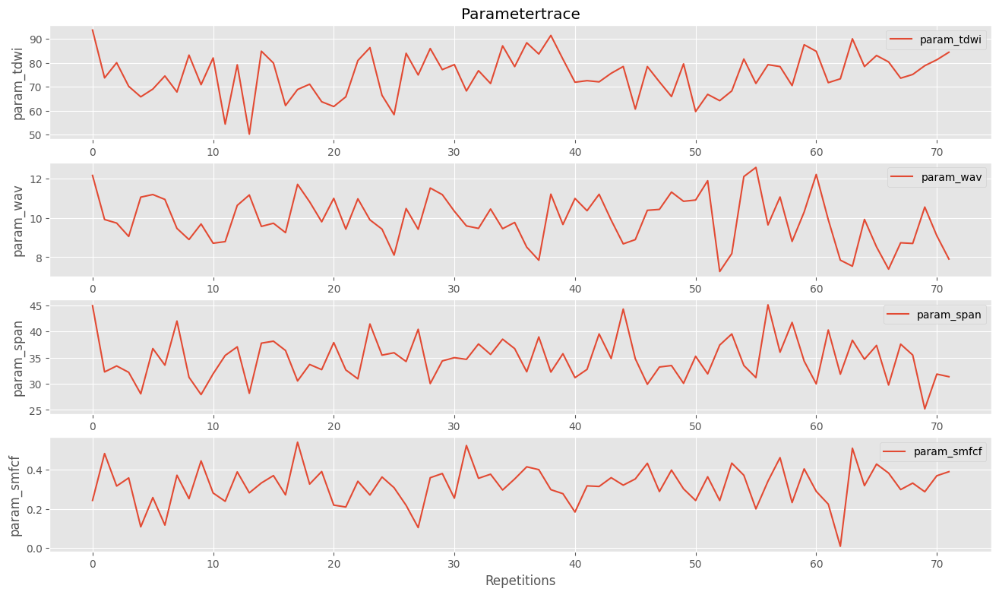

In [46]:
results = sampler.getdata()                          # Load the results
spotpy.analyser.plot_parametertrace(results)         # Show the results

In [47]:
p = copy.deepcopy(parameters)
p.set_override("TDWI", 72.528)
p.set_override("WAV", 10.1205)
p.set_override("SPAN", 29.4625)
p.set_override("SMFCF", 0.33968)

wofost_optimal = Wofost72_WLP_FD(p, weatherd, agrod)
wofost_optimal.run_till_terminate()
df_optimal = pd.DataFrame(wofost_optimal.get_output())
df_optimal['day'] = pd.to_datetime(df_optimal['day'])
df_optimal = df_optimal.set_index("day")

df_optimal

--- Logging error ---
Traceback (most recent call last):
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 74, in emit
    self.doRollover()
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 179, in doRollover
    self.rotate(self.baseFilename, dfn)
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\logging\handlers.py", line 115, in rotate
    os.rename(source, dest)
PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\noe\\.pcse\\logs\\pcse.log' -> 'C:\\Users\\noe\\.pcse\\logs\\pcse.log.1'
Call stack:
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\noe\AppData\Roaming\Pyth

,DVS,LAI,TAGP,TWSO,TWLV,TWST,TWRT,TRA,RD,SM,WWLOW
day,,,,,,,,,,,
2022-04-22,-0.100000,0.072992,58.02240,0.000000,42.936576,15.085824,14.505600,0.0,10.0,0.400000,22.600500
2022-04-23,-0.096396,0.072992,58.02240,0.000000,42.936576,15.085824,14.505600,0.0,10.0,0.339880,22.474615
2022-04-24,-0.092859,0.072992,58.02240,0.000000,42.936576,15.085824,14.505600,0.0,10.0,0.337452,22.450338
2022-04-25,-0.088984,0.072992,58.02240,0.000000,42.936576,15.085824,14.505600,0.0,10.0,0.324041,22.316227
2022-04-26,-0.086318,0.072992,58.02240,0.000000,42.936576,15.085824,14.505600,0.0,10.0,0.319668,22.272493
...,...,...,...,...,...,...,...,...,...,...,...
2022-10-02,1.983857,0.000000,14520.09352,11068.984353,1843.037042,1608.072125,1414.214751,0.0,50.0,0.239902,24.134235
2022-10-03,1.989233,0.000000,14520.09352,11068.984353,1843.037042,1608.072125,1414.214751,0.0,50.0,0.262628,25.270542
2022-10-04,1.993524,0.000000,14520.09352,11068.984353,1843.037042,1608.072125,1414.214751,0.0,50.0,0.260858,25.182078


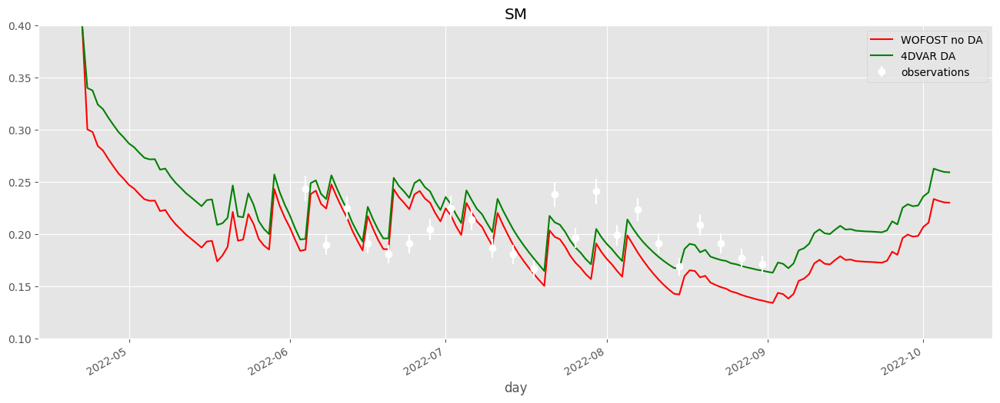

In [48]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(16,6), sharex=True)
df_wofost_noDA["SM"].plot(ax=axes, label="WOFOST no DA", alpha=1.0, color='r')
df_optimal["SM"].plot(ax=axes, label="4DVAR DA", alpha=1.0, color='g')
# axes.plot(df_obs['Date/heure'], df_obs['SM'], label="Observations", color='b')
axes.errorbar(dates_of_observation, observed_sm, yerr=std_sm, fmt="o", label="observations", color='white')
axes.set_title("SM")
#axes[1].set_title("Volumetric soil moisture")
fig.autofmt_xdate()
axes.set_ylim([0.10, 0.4])
plt.legend()

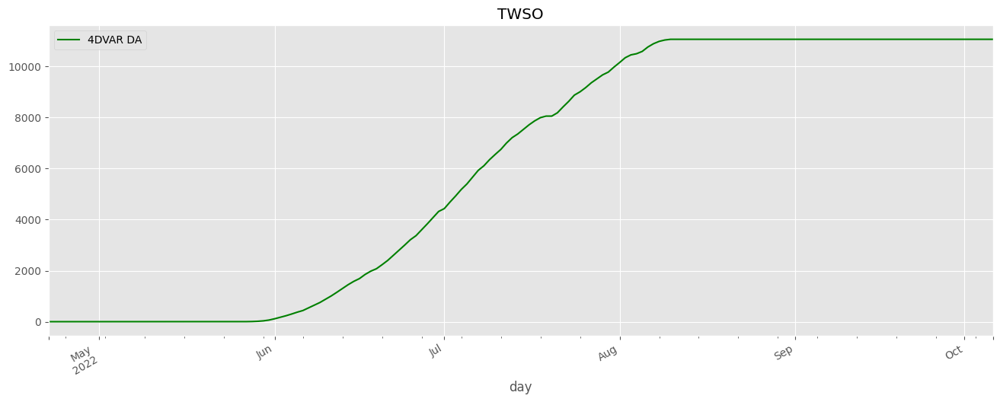

In [49]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(16,6), sharex=True)
df_optimal["TWSO"].plot(ax=axes, label="4DVAR DA", alpha=1.0, color='g')
#axes.plot(df_obs['Date/heure'], df_obs['SM'], label="Observations", color='b')
axes.set_title("TWSO")
#axes[1].set_title("Volumetric soil moisture")
fig.autofmt_xdate()
#axes.set_ylim([0.10, 0.4])
plt.legend()

RSME en pourcentage pour un pas de 4 avec PF : 0.12461555443173093


c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\noe\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


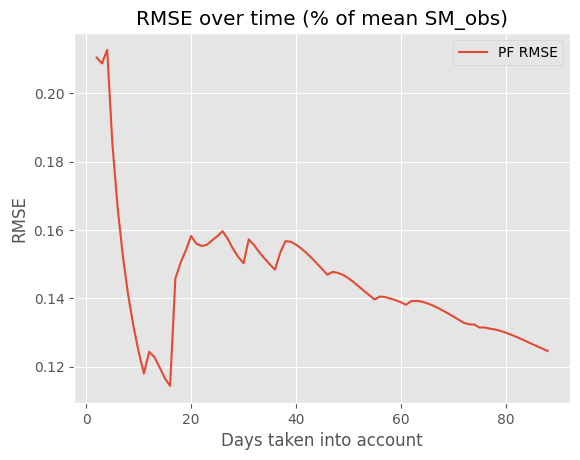

In [50]:
df_obs_undersample = df_obs[df_obs['Date/heure'].dt.hour == 0]
minDay = str(df_obs_undersample['Date/heure'].min())
maxDay = str(df_obs_undersample['Date/heure'].max())

SM_obs = df_obs_undersample['SM'].to_numpy()
SM_DA = df_optimal.loc[(df_optimal.index >= minDay) & (df_optimal.index <= maxDay), 'SM'].to_numpy()
rsme = {i:np.sqrt(np.mean((SM_obs[1:i]-SM_DA[1:i])**2)) for i in range(len(SM_DA))}

print("RSME en pourcentage pour un pas de {} avec PF : {}".format(NB_DAYS_DELTA, rsme[len(SM_DA)-1]/np.mean(SM_obs)))
# print("RSME témoin sans apprentissage : {}".format(np.sqrt(np.mean((SM_obs-SM_noDA)**2))/np.mean(SM_obs)))
plt.plot(list(rsme.keys()),list(rsme.values())/np.mean(SM_obs), label="PF RMSE")
plt.title("RMSE over time (% of mean SM_obs)")
plt.xlabel("Days taken into account")
plt.ylabel("RMSE")
plt.legend()

On peut tirer plusieurs conclusion de ce dernier graphique. Le RMSE est initalement très grand: le PF n'est pas très efficace. Après plusieurs itérations, il se stagne vers 0.035 d'écart, ce qui correspond à 17,5% d'écarts sur la période.
<style>
    table {
        width: 100%;
    }
</style>
| Pas des jours | Erreur RMSE (%) |
|---------------|------- |
|1|12,4|
| 2             | 12,4  |
| 4             | 12,4   |
| 8             | 12,4 |
| 10            | 16,6    |
| témoin        | 15    | 
